# POS Tagger Trained on the UD Treebank

Adapted from https://github.com/soutsios/pos_tagger_mlp/blob/master/pos_tagger_mlp.ipynb 

In [1]:
import pyconll, nltk, datetime, warnings
import numpy as np
from scipy.sparse import vstack
import matplotlib.pyplot as plt
from sklearn.feature_extraction import DictVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import StratifiedKFold, GridSearchCV, learning_curve
from sklearn.exceptions import UndefinedMetricWarning
warnings.filterwarnings(action='ignore', category=UndefinedMetricWarning)
from numpy.random import seed

# Plot Functions

These functions are useful to visualize the training dynamics of the learning algorithm and the confusion matrix of the trained models.

In [2]:
def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=None, train_sizes=np.linspace(.1, 1.0, 5)):
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Accuracy")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='accuracy')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

In [3]:
def plot_confusion_matrix(f1,
                          cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True,
                          i=1):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy
    plt.figure(figsize=(10, 6))
    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}; f1-score={:0.4f}'.format(accuracy, misclass, f1))

# Load Dataset

In [4]:
UD_ENGLISH_TRAIN = '../UD_English-EWT/en_ewt-ud-train.conllu'
UD_ENGLISH_DEV = '../UD_English-EWT/en_ewt-ud-dev.conllu'
UD_ENGLISH_TEST = '../UD_English-EWT/en_ewt-ud-test.conllu'

# Preprocessing

In [5]:
def read_conllu(path):
    data = pyconll.load_from_file(path)
    tagged_sentences=[]
    original_sentences=[]
    t=0
    for sentence in data:
        original_sentences.append(sentence.text)
        tagged_sentence=[]
        for token in sentence:
            if token.upos:
                t+=1
                tagged_sentence.append((token.form if token.form else '*None*', token.upos))
        tagged_sentences.append(tagged_sentence)
    return tagged_sentences, original_sentences

Load train, development and test set in the appropriate tagged format, tuple (word, pos-tag)

In [6]:
train_sentences, train_original = read_conllu(UD_ENGLISH_TRAIN)
val_sentences, val_original = read_conllu(UD_ENGLISH_DEV)
test_sentences, test_original = read_conllu(UD_ENGLISH_TEST)

Print statistics

In [7]:
print("Tagged sentences in train set: ", len(train_sentences))
print("Tagged words in train set:", len([item for sublist in train_sentences for item in sublist]))
print(40*'=')
print("Tagged sentences in dev set: ", len(val_sentences))
print("Tagged words in dev set:", len([item for sublist in val_sentences for item in sublist]))
print(40*'=')
print("Tagged sentences in test set: ", len(test_sentences))
print("Tagged words in test set:", len([item for sublist in test_sentences for item in sublist]))

Tagged sentences in train set:  12544
Tagged words in train set: 204616
Tagged sentences in dev set:  2001
Tagged words in dev set: 25153
Tagged sentences in test set:  2077
Tagged words in test set: 25096


In [8]:
print(train_sentences[0])

[('Al', 'PROPN'), ('-', 'PUNCT'), ('Zaman', 'PROPN'), (':', 'PUNCT'), ('American', 'ADJ'), ('forces', 'NOUN'), ('killed', 'VERB'), ('Shaikh', 'PROPN'), ('Abdullah', 'PROPN'), ('al', 'PROPN'), ('-', 'PUNCT'), ('Ani', 'PROPN'), (',', 'PUNCT'), ('the', 'DET'), ('preacher', 'NOUN'), ('at', 'ADP'), ('the', 'DET'), ('mosque', 'NOUN'), ('in', 'ADP'), ('the', 'DET'), ('town', 'NOUN'), ('of', 'ADP'), ('Qaim', 'PROPN'), (',', 'PUNCT'), ('near', 'ADP'), ('the', 'DET'), ('Syrian', 'ADJ'), ('border', 'NOUN'), ('.', 'PUNCT')]


In [9]:
def tag_sequence(sentences):
    return [[t for w, t in sentence] for sentence in sentences]

def text_sequence(sentences):
    return [[w for w, t in sentence] for sentence in sentences]

def id2word(sentences):
    wordlist = [item for sublist in text_sequence(sentences) for item in sublist]
    id2word = {k:v for k,v in enumerate(wordlist)}
    return id2word

def untag(tagged_sentence):
    return [w for w, _ in tagged_sentence]

def untag_pos(tagged_sentence):
    return [t for _, t in tagged_sentence]

def build_vocab(sentences):
    vocab =set()
    for sentence in sentences:
        for word in untag(sentence):
            vocab.add(word)
    return sorted(list(vocab))

An important observation: how many terms are in validation set and not found in train set? (This estimates the Out-of-vocabulary rate.)

In [10]:
list_1 = build_vocab(train_sentences)
list_2 = build_vocab(val_sentences)
diff_list = [item for item in list_2 if item not in list_1]
print('Number of terms not found in train set:',len(diff_list))

Number of terms not found in train set: 1661


# Feature Engineering

We use the "classical" machine learning approach: we will train a token classifier model. The classifier gets as input a feature vector describing each token in the sentence. We decide a priori which features are informative to make the tagging decision. In this case, we use a combination of "word shape" features which approximate morphological knowledge. We naturally also include lexical information (the token form itself), and some form of "syntactic knowledge" by adding reference to the previous and next word in each token feature vector.

In [11]:
def features_basic(sentence, index):
    """ sentence: [w1, w2, ...], index: the index of the word """
    return {
        'nb_terms': len(sentence),        
        'word': sentence[index],
        'word_lower': sentence[index].lower(),
        'is_first': index == 0,
        'is_last': index == len(sentence) - 1,
        'is_capitalized': sentence[index][0].upper() == sentence[index][0],
        'is_all_caps': sentence[index].upper() == sentence[index],
        'is_all_lower': sentence[index].lower() == sentence[index],
        'prefix-1': sentence[index][0],
        'prefix-2': sentence[index][:2],
        'prefix-3': sentence[index][:3],
        'suffix-1': sentence[index][-1],
        'suffix-2': sentence[index][-2:],
        'suffix-3': sentence[index][-3:],
        'i-1_prefix-3': '' if index == 0 else sentence[index-1][:3],        
        'i-1_suffix-3': '' if index == 0 else sentence[index-1][-3:],        
        'i+1_prefix-3': '' if index == len(sentence) - 1 else sentence[index+1][:3],        
        'i+1_suffix-3': '' if index == len(sentence) - 1 else sentence[index+1][-3:],        
        'prev_word': '' if index == 0 else sentence[index - 1].lower(),
        'next_word': '' if index == len(sentence) - 1 else sentence[index + 1].lower(),
        'has_hyphen': '-' in sentence[index],
        'is_numeric': sentence[index].isdigit(),
        'capitals_inside': sentence[index][1:].lower() != sentence[index][1:],
    }

In the scikit-learn model, we model a dataset as a pair of two data structures:
* The list of feature dictionaries X (one feature dictionary for each token)
* The list of predicted label y (one tag for each token)

In [12]:
def transform_to_dataset(tagged_sentences):
    X, y = [], []
    for doc_index, tagged in enumerate(tagged_sentences):
        for index in range(len(tagged)):
            X.append([features_basic(untag(tagged), index)])
            y.append(tagged[index][1])
    return X, y

Given a sentence represented as a list of tokens, return the list of feature dictionaries using our feature encoding method:

In [13]:
def transform_test_sentence(sentence):
    X = []
    for index in range(len(sentence)):
            X.append([features_basic(sentence, index)])
    return X

## Test untag()

We use untag() to extract raw sentences from the annotated CoNLL dataset. This way we can reproduce a sentence without tags, submit it to the tagger and compare predictions to the gold tags that are provided in the dataset.

In [14]:
untag(test_sentences[1])

['What',
 'if',
 'Google',
 'expanded',
 'on',
 'its',
 'search',
 '-',
 'engine',
 '(',
 'and',
 'now',
 'e-mail',
 ')',
 'wares',
 'into',
 'a',
 'full',
 '-',
 'fledged',
 'operating',
 'system',
 '?']

# Dataset Transformation

Before we can apply a generic machine learning algorithm (such as Logistic Regression), we need to encode the dataset into a vectorized format.

We proceed in two steps: feature engineering and vectorization.

For each token, we create a dictionary of features that depend on the sentence from which the token is extracted. 
These features include the word itself, the word before and the word after, letter suffixes and prefixes, etc.

In the scikit-learn approach, before we can use a generic machine learning algorithm, we must then "vectorize" the feature dictionaries into vector encodings.
For example, lexical features are encoded into one-hot vectors whose dimension is the size of the vocabulary.
Note the difference between the method `fit_transform` of the vectorizer, which "learns" how to vectorize features, and `transform` which applies a learned vectorizer to feature dictionaries.  We use `fit_transform` on the training data, and `transform` on the other sections (validation and test).

These vector representations are what is passed to the machine learning algorithm.

In [15]:
def vectorize(train, val, test):

    print('Feature encoding method')
    print('Vectorizing Dataset...')
    print('Vectorizing train...')
    X_train, y_train = transform_to_dataset(train)
    v = DictVectorizer(sparse=True) 
    X_train = v.fit_transform([x[0] for x in X_train])
    
    print('Vectorizing validation...')
    X_val, y_val = transform_to_dataset(val)
    X_val = v.transform([x[0] for x in X_val])        
    
    print('Vectorizing test...')
    X_test, y_test = transform_to_dataset(test)
    X_test = v.transform([x[0] for x in X_test])
    
    print('Dataset vectorized.')
    print('Train shape:', X_train.shape)
    print('Validation shape:', X_val.shape)
    print('Test shape:', X_test.shape)
    
    # Compress sparse matrices
    X_train = X_train 
    X_val = X_val 
    X_test = X_test
    return X_train, y_train, X_val, y_val, X_test, y_test, v
    

# Baseline Tagger

Before we train a "real" machine learning algorithm using scikit-learn, we will repeat the very simple statistical method we discussed in class.
We train and evaluate the Baseline Unigram tagger to compare performance with the tagger we will train next.

In [16]:
default_tagger = nltk.DefaultTagger('NOUN')
unigram_tagger = nltk.UnigramTagger(train_sentences+val_sentences, backoff=default_tagger)

In [17]:
y_train = [item for sublist in tag_sequence(train_sentences+val_sentences) for item in sublist]
y_test = [item for sublist in tag_sequence(test_sentences) for item in sublist]
classes = sorted(list(set(y_train)))

In [18]:
def tag_list(tagged_sents):
    return [tag for sent in tagged_sents for (word, tag) in sent]
def apply_tagger(tagger, corpus):
    return [tagger.tag(nltk.tag.untag(sent)) for sent in corpus]

In [19]:
y_pred = tag_list(apply_tagger(unigram_tagger, test_sentences))
print("Accuracy: {0:.4f}".format(unigram_tagger.accuracy(test_sentences)))
print('f1-macro score: {0:.4f}'.format(f1_score(y_test, y_pred, zero_division=1, average='macro')))

Accuracy: 0.8671
f1-macro score: 0.7965


In [20]:
print(classification_report(y_test, y_pred, zero_division=1, digits=4))

              precision    recall  f1-score   support

         ADJ     0.9158    0.8367    0.8745      1794
         ADP     0.8697    0.8813    0.8755      2030
         ADV     0.9341    0.8030    0.8636      1183
         AUX     0.9233    0.8970    0.9099      1543
       CCONJ     0.9892    0.9973    0.9932       736
         DET     0.9612    0.9678    0.9645      1896
        INTJ     0.9655    0.6942    0.8077       121
        NOUN     0.6879    0.9331    0.7920      4123
         NUM     0.9146    0.6125    0.7337       542
        PART     0.6959    0.9769    0.8128       649
        PRON     0.9665    0.9321    0.9490      2166
       PROPN     0.9240    0.5443    0.6851      2076
       PUNCT     0.9941    0.9861    0.9901      3096
       SCONJ     0.6257    0.5964    0.6107       384
         SYM     0.8125    0.8349    0.8235       109
        VERB     0.8880    0.8243    0.8549      2606
           X     1.0000    0.0000    0.0000        42

    accuracy              

See what errors the Baseline tagger makes:

In [21]:
def check_tagger(tagged_sentence):
    note = ''
    for tup in list(zip(unigram_tagger.tag(untag(tagged_sentence)),untag_pos(tagged_sentence))):
        if tup[0][1]!=tup[1]: note='<<--- Error!'
        print(tup[0], tup[1], note)
        note=''

In [22]:
check_tagger(test_sentences[1])

('What', 'PRON') PRON 
('if', 'SCONJ') SCONJ 
('Google', 'PROPN') PROPN 
('expanded', 'VERB') VERB 
('on', 'ADP') ADP 
('its', 'PRON') PRON 
('search', 'NOUN') NOUN 
('-', 'PUNCT') PUNCT 
('engine', 'NOUN') NOUN 
('(', 'PUNCT') PUNCT 
('and', 'CCONJ') CCONJ 
('now', 'ADV') ADV 
('e-mail', 'NOUN') NOUN 
(')', 'PUNCT') PUNCT 
('wares', 'NOUN') NOUN 
('into', 'ADP') ADP 
('a', 'DET') DET 
('full', 'ADJ') ADV <<--- Error!
('-', 'PUNCT') PUNCT 
('fledged', 'NOUN') ADJ <<--- Error!
('operating', 'NOUN') NOUN 
('system', 'NOUN') NOUN 
('?', 'PUNCT') PUNCT 


It makes mistakes. Unsurprising given its simplistic approach and the small size of the training data.

In [23]:
cnf_matrix = confusion_matrix(y_test, y_pred)
name='Baseline'

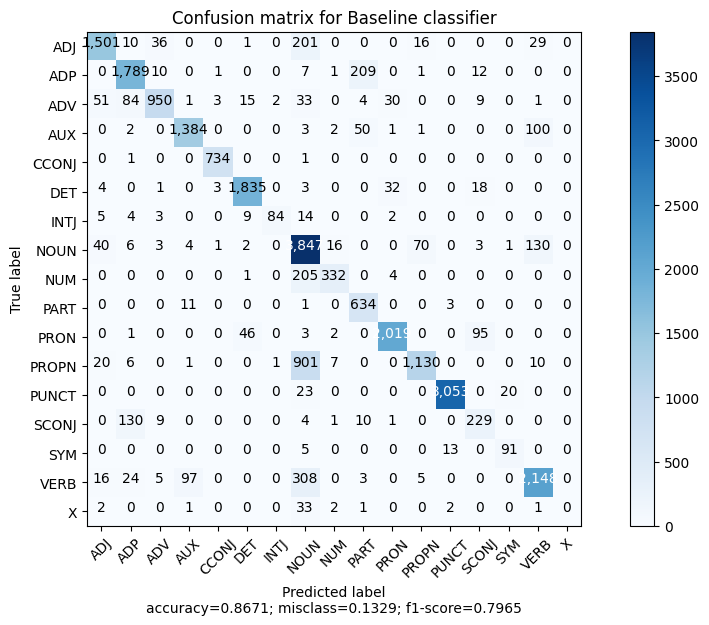

In [24]:
plot_confusion_matrix(f1_score(y_test, y_pred, average='macro'), cnf_matrix, target_names=classes, title='Confusion matrix for '+name+' classifier', normalize=False)

# Train a Logistic Regression Model

Let us move to a more serious machine learning model. We will train a Logistic Regression model using our feature extraction function based on our "expertise" in the domain.

We first transform the whole dataset from the CoNLL format into the scikit-learn vectorized encoding using our feature extraction method.

In [25]:
X_train, y_train, X_val, y_val, X_test, y_test, vec = vectorize(train_sentences, val_sentences, test_sentences)

Feature encoding method
Vectorizing Dataset...
Vectorizing train...
Vectorizing validation...
Vectorizing test...
Dataset vectorized.
Train shape: (204616, 98724)
Validation shape: (25153, 98724)
Test shape: (25096, 98724)


## Hyper-parameter Tuning

The Logistic Regression algorithm uses a hyper-parameter called C.  We tune the value of this parameter by testing different values on a subset of the training data and observing the impact of the C parameter on selected metrics (accuracy and F1).

Because we will use cross-validation, we can use the full train set (train + validation)

In [26]:
X_train = vstack((X_train, X_val))
y_train = np.append(y_train, y_val, axis=0)

In [27]:
X_train.shape

(229769, 98724)

In [28]:
y_train.shape

(229769,)

In [29]:
def hyper_tuning(train, test, y_train, y_test, scores, estimator, parameters, cv):
    print("# Estimator:",estimator)
    for score in scores:
        print("# Tuning hyper-parameters for %s" % score)        
        clf = GridSearchCV(estimator, parameters, cv=cv, scoring='%s' % score)
        clf.fit(train, y_train)
        print("Best parameters set found on development set:")
        print(clf.best_params_)
        print()
        print("Grid scores on development set:")
        means = clf.cv_results_['mean_test_score']
        stds = clf.cv_results_['std_test_score']
        for mean, std, params in zip(means, stds, clf.cv_results_['params']):
            print("%0.3f (+/-%0.03f) for %r" % (mean, std * 2, params))
        print()
        print("Detailed classification report:")
        print("The model is trained on the full development set.")
        print("The scores are computed on the full evaluation set.")
        y_pred = clf.predict(test)
        print(classification_report(y_test, y_pred, digits=4))
        print('Accuracy: {0:0.4f}   f1-score: {1:0.4f} \n'.format(accuracy_score(y_test, y_pred), f1_score(y_test, y_pred, average='macro')))
    return clf

In [30]:
# logregr = LogisticRegression(solver='liblinear', random_state=13)
# # Cross validation strategy
# skf = StratifiedKFold(n_splits=4)
# # Scores could also be ['precision', 'recall', ....]
# scores = ['accuracy', 'f1_macro']

# params = [{'C': [0.1, 1, 2, 3, 4, 5, 10, 20, 50]}]
# #logregr = hyper_tuning(X_train, X_test, y_train, y_test, scores, logregr, params, skf)
# #You may want to comment previous line and comment-out next lines to see how hyper-tuning works and dont wait too much time...
# skf = StratifiedKFold(n_splits=4)
# logregr = hyper_tuning(X_train[:500], X_test[:50], y_train[:500], y_test[:50], scores, logregr, params, skf)

## Training

We can now training using the best hyper-parameter selected above.  This takes a few minutes.

In [31]:
import os
import joblib

t_ini = datetime.datetime.now()
print('Training...')
clf = LogisticRegression(C=20, solver='liblinear', random_state=13)
model_path = 'lr_pos_tagger.joblib'

if os.path.exists(model_path):
    print(f"Loading existing model from {model_path}")
    clf = joblib.load(model_path)
else:
    print("Training new model...")
    clf.fit(X_train, y_train)
    # Save the model for future use
    joblib.dump(clf, model_path)
    print(f"Model saved to {model_path}")
t_fin = datetime.datetime.now()
print('Training completed in {} seconds'.format((t_fin - t_ini).total_seconds()))

Training...
Loading existing model from lr_pos_tagger.joblib
Training completed in 0.189189 seconds


c:\Users\talma\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\base.py:380: InconsistentVersionWarning: Trying to unpickle estimator LogisticRegression from version 1.5.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


# Evaluation

In [32]:
y_pred = clf.predict(X_test)

In [33]:
print("Accuracy: {0:.4f}".format(clf.score(X_test, y_test)))
print('f1-macro score: {0:.4f}'.format(f1_score(y_test, y_pred, average='macro')))

Accuracy: 0.9452
f1-macro score: 0.9041


## Classification Report

In [34]:
print(classification_report(y_test, clf.predict(X_test), digits=4))

              precision    recall  f1-score   support

         ADJ     0.9193    0.9013    0.9102      1794
         ADP     0.9333    0.9586    0.9458      2030
         ADV     0.9204    0.8893    0.9046      1183
         AUX     0.9781    0.9819    0.9799      1543
       CCONJ     0.9946    0.9932    0.9939       736
         DET     0.9915    0.9900    0.9908      1896
        INTJ     0.9712    0.8347    0.8978       121
        NOUN     0.9036    0.9209    0.9122      4123
         NUM     0.9743    0.9797    0.9770       542
        PART     0.9799    0.9769    0.9784       649
        PRON     0.9862    0.9875    0.9869      2166
       PROPN     0.8824    0.8603    0.8712      2076
       PUNCT     0.9916    0.9971    0.9944      3096
       SCONJ     0.8544    0.8099    0.8316       384
         SYM     0.8990    0.8165    0.8558       109
        VERB     0.9451    0.9574    0.9512      2606
           X     0.5200    0.3095    0.3881        42

    accuracy              

## Frequent Types of Mistakes

In [35]:
import collections
k=0
i2w = id2word(test_sentences)
error_counter = collections.Counter()
for i in range(X_test.shape[0]):
    correct_tag_id = y_test
    if y_pred[i]!=y_test[i]:
        k += 1
        word = i2w[i]
        error_counter[word] += 1
print('Accuracy: {0:.4f}'.format((len(i2w)-k)/len(i2w)))
print('Total errors/Total words: {}/{}\n'.format(k,len(i2w)))
print('Most common errors:',error_counter.most_common(20))

Accuracy: 0.9452
Total errors/Total words: 1375/25096

Most common errors: [('that', 25), ('as', 23), ('to', 23), ('like', 22), ('out', 18), ('for', 18), ('up', 18), ('/', 17), ('in', 17), ('on', 12), ('01-Feb-02', 11), ('much', 10), ('one', 9), ('-', 9), ('so', 8), ('all', 7), ('have', 7), ('be', 7), ('of', 6), ('has', 6)]


## Learning Curves

The following diagram illustrates the "training dynamics" of the LR model: how fast does it improve as it keeps training. Originally, the difference between the test dataset and the cross-validation (on part of the test data) is large; as training proceeds, the gap reduces. This diagram is important to verify we do not have a case of over-fitting - where the model does "very well" on training data and does not improve on test data.  

This computation takes a long time (as we keep training and evaluating multiple times to obtain the snapshots). It is not necessary to run the rest of the notebook so that you can safely skip it.

In [36]:
#plot_learning_curve(clf, 'Logistic Regression', X_train, y_train, ylim=(0.7, 1.01), cv=5)

## Confusion Matrix

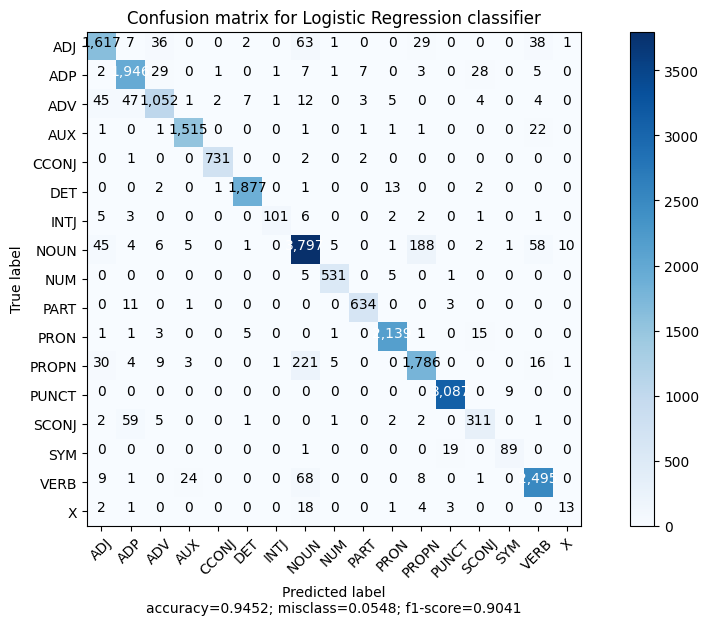

In [37]:
y_pred = clf.predict(X_test)
f1 = f1_score(y_test, y_pred, average='macro')
cnf_matrix = confusion_matrix(y_test, y_pred)
name='Logistic Regression'
plot_confusion_matrix(f1, cnf_matrix, target_names=classes, title='Confusion matrix for '+name+' classifier', normalize=False)

## Tag an Unknown Sentence

Lets try our trained tagger on new sentences.  To tag a sentence given as a string, we must apply the following steps:
* Tokenize the string into a list of tokens
* Turn each token into a features dictionary (using the features used by our model)
* Turn the list of feature dictionaries into vectors (using scikit-learn vectorization method)
* Pass the resulting matrix (one row vector for each token) to the classifier.

In [38]:
# Need to download the nltk model for sentence tokenizer
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\talma\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [39]:
tokens = nltk.word_tokenize('Word embeddings provide a dense representation of words and their relative meanings.')
print(tokens)

['Word', 'embeddings', 'provide', 'a', 'dense', 'representation', 'of', 'words', 'and', 'their', 'relative', 'meanings', '.']


In [40]:
X_features = transform_test_sentence(tokens)

In [41]:
X_features

[[{'nb_terms': 13,
   'word': 'Word',
   'word_lower': 'word',
   'is_first': True,
   'is_last': False,
   'is_capitalized': True,
   'is_all_caps': False,
   'is_all_lower': False,
   'prefix-1': 'W',
   'prefix-2': 'Wo',
   'prefix-3': 'Wor',
   'suffix-1': 'd',
   'suffix-2': 'rd',
   'suffix-3': 'ord',
   'i-1_prefix-3': '',
   'i-1_suffix-3': '',
   'i+1_prefix-3': 'emb',
   'i+1_suffix-3': 'ngs',
   'prev_word': '',
   'next_word': 'embeddings',
   'has_hyphen': False,
   'is_numeric': False,
   'capitals_inside': False}],
 [{'nb_terms': 13,
   'word': 'embeddings',
   'word_lower': 'embeddings',
   'is_first': False,
   'is_last': False,
   'is_capitalized': False,
   'is_all_caps': False,
   'is_all_lower': True,
   'prefix-1': 'e',
   'prefix-2': 'em',
   'prefix-3': 'emb',
   'suffix-1': 's',
   'suffix-2': 'gs',
   'suffix-3': 'ngs',
   'i-1_prefix-3': 'Wor',
   'i-1_suffix-3': 'ord',
   'i+1_prefix-3': 'pro',
   'i+1_suffix-3': 'ide',
   'prev_word': 'word',
   'next_word'

In [42]:
X_vectorized = vec.transform([x[0] for x in X_features])

In [43]:
# The vectorized sentence is a sparse matrix with one row for each token and columns for the vectorized features
# For example, if the vocabulary has 1000 unique words, the vectorized sentence will have 1000 columns for each word feature.
# This is a very sparse matrix, where most of the values are zero.
X_vectorized.shape

(13, 98724)

In [44]:
pred = clf.predict(X_vectorized)

In [45]:
# np.str_ is a subclass of str that is used to represent string arrays in NumPy.
print('Here is what our LR tagger predicts for the test sentence:\n',list(zip(tokens, pred)))

Here is what our LR tagger predicts for the test sentence:
 [('Word', np.str_('PROPN')), ('embeddings', np.str_('NOUN')), ('provide', np.str_('VERB')), ('a', np.str_('DET')), ('dense', np.str_('ADJ')), ('representation', np.str_('NOUN')), ('of', np.str_('ADP')), ('words', np.str_('NOUN')), ('and', np.str_('CCONJ')), ('their', np.str_('PRON')), ('relative', np.str_('ADJ')), ('meanings', np.str_('NOUN')), ('.', np.str_('PUNCT'))]


Let's turn this process into a prediction function from a sentence encoded as a single string to a list of pairs (token, predicted_tag):

In [46]:
def predict_sentence(sentence):
   tokens = nltk.word_tokenize(sentence)
   X_features = transform_test_sentence(tokens)
   X_vectorized = vec.transform([x[0] for x in X_features])
   pred = clf.predict(X_vectorized)
   return list(zip(tokens, pred))

In [47]:
predict_sentence("Let me join the chorus of annoyance over Google's new toolbar , which, as noted in the linked article, commits just about every sin an online marketer could commit, and makes up a few new ones besides.")

[('Let', np.str_('VERB')),
 ('me', np.str_('PRON')),
 ('join', np.str_('VERB')),
 ('the', np.str_('DET')),
 ('chorus', np.str_('NOUN')),
 ('of', np.str_('ADP')),
 ('annoyance', np.str_('NOUN')),
 ('over', np.str_('ADP')),
 ('Google', np.str_('PROPN')),
 ("'s", np.str_('PART')),
 ('new', np.str_('ADJ')),
 ('toolbar', np.str_('NOUN')),
 (',', np.str_('PUNCT')),
 ('which', np.str_('PRON')),
 (',', np.str_('PUNCT')),
 ('as', np.str_('SCONJ')),
 ('noted', np.str_('VERB')),
 ('in', np.str_('ADP')),
 ('the', np.str_('DET')),
 ('linked', np.str_('VERB')),
 ('article', np.str_('NOUN')),
 (',', np.str_('PUNCT')),
 ('commits', np.str_('NOUN')),
 ('just', np.str_('ADV')),
 ('about', np.str_('ADV')),
 ('every', np.str_('DET')),
 ('sin', np.str_('VERB')),
 ('an', np.str_('DET')),
 ('online', np.str_('ADJ')),
 ('marketer', np.str_('NOUN')),
 ('could', np.str_('AUX')),
 ('commit', np.str_('VERB')),
 (',', np.str_('PUNCT')),
 ('and', np.str_('CCONJ')),
 ('makes', np.str_('VERB')),
 ('up', np.str_('ADP'

# Collect Hard Sentences

Hard sentences are sentences that contain multiple wrongly predicted tags given our classifier.

Write code to collect hard sentences given a classifier clf.

In [60]:
def errors_in_sentence_prediction(clf, tagged_sentence):
    """
    Given a tagged sentence from the dataset, return the number of errors and the predicted tags.
    
    Args:
        clf: The trained Logistic Regression classifier
        tagged_sentence: A sentence with ground truth tags from the UD dataset
            (typically a list of (word, tag) tuples)
    
    Returns:
        errors: The number of errors in the predicted tags
        pred: The list of predicted tags
    """
    # add debug prints 
    #print("Tagged Sentence:", tagged_sentence)
    # Extract true tags for later comparison
    true_tags = [tag for _, tag in tagged_sentence]
    #print(f"true tags: {true_tags}")
    # Convert single sentence to features format expected by the classifier
    # This creates a list of (features_dict, tag) tuples similar to transform_to_dataset
    X_sentence, _ = transform_to_dataset([tagged_sentence])
    #print(f"X_s {X_sentence}")
    # Use the same vectorizer that was used in training
    X_sentence_vectorized = vec.transform([x[0] for x in X_sentence])
    
    # Make predictions
    pred = clf.predict(X_sentence_vectorized)
    
    # Count errors by comparing predictions to true tags
    errors = sum(1 for i, tag in enumerate(true_tags) if pred[i] != tag)
    
    return errors, pred

In [49]:
hard_sentences = []
for s in test_sentences:
    errors, pred = errors_in_sentence_prediction(clf, s)
    if errors > 0:
        hard_sentences.append((s, errors, pred))
print(f'Number of sentences with errors: {len(hard_sentences)} out of {len(test_sentences)}')

Tagged Sentence: [('What', 'PRON'), ('if', 'SCONJ'), ('Google', 'PROPN'), ('Morphed', 'VERB'), ('Into', 'ADP'), ('GoogleOS', 'PROPN'), ('?', 'PUNCT')]
true tags: ['PRON', 'SCONJ', 'PROPN', 'VERB', 'ADP', 'PROPN', 'PUNCT']
X_s [[{'nb_terms': 7, 'word': 'What', 'word_lower': 'what', 'is_first': True, 'is_last': False, 'is_capitalized': True, 'is_all_caps': False, 'is_all_lower': False, 'prefix-1': 'W', 'prefix-2': 'Wh', 'prefix-3': 'Wha', 'suffix-1': 't', 'suffix-2': 'at', 'suffix-3': 'hat', 'i-1_prefix-3': '', 'i-1_suffix-3': '', 'i+1_prefix-3': 'if', 'i+1_suffix-3': 'if', 'prev_word': '', 'next_word': 'if', 'has_hyphen': False, 'is_numeric': False, 'capitals_inside': False}], [{'nb_terms': 7, 'word': 'if', 'word_lower': 'if', 'is_first': False, 'is_last': False, 'is_capitalized': False, 'is_all_caps': False, 'is_all_lower': True, 'prefix-1': 'i', 'prefix-2': 'if', 'prefix-3': 'if', 'suffix-1': 'f', 'suffix-2': 'if', 'suffix-3': 'if', 'i-1_prefix-3': 'Wha', 'i-1_suffix-3': 'hat', 'i+1_p

Draw a histogram showing how the sentences in the test dataset are distributed in terms of prediction errors per sentence.

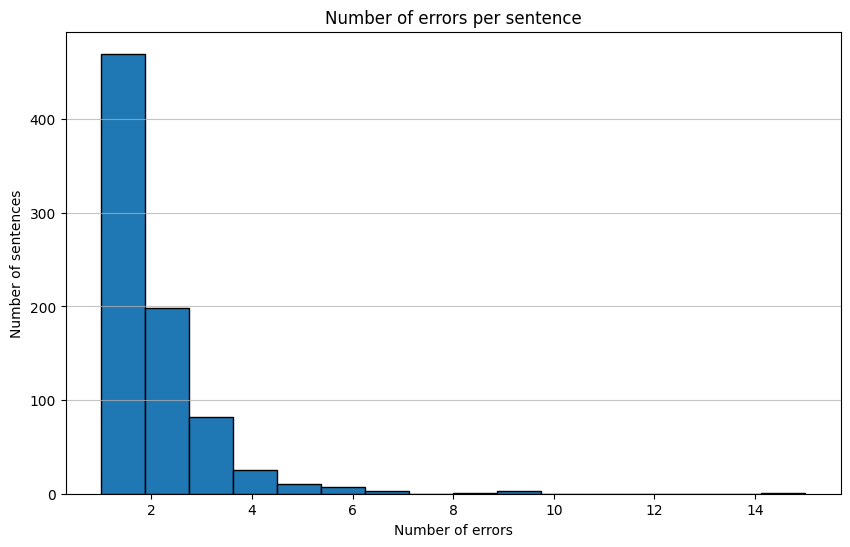

In [ ]:
# Draw a histogram of the number of errors per sentence
plt.figure(figsize=(10, 6))
plt.hist([x[1] for x in hard_sentences], bins=16, edgecolor='black')
plt.title('Number of errors per sentence')
plt.xlabel('Number of errors')
plt.ylabel('Number of sentences')
plt.grid(axis='y', alpha=0.75)
plt.show()


# 1. Complete the histogram showing distribution of sentences by error count
plt.figure(figsize=(10, 6))
error_counts = [s[1] for s in test_sentences]
plt.hist(error_counts, bins=range(1, max(error_counts) + 2), edgecolor="black")
plt.title("Distribution of Sentences by Number of Tagging Errors")
plt.xlabel("Number of Errors")
plt.ylabel("Number of Sentences")
plt.xticks(range(1, max(error_counts) + 1))
plt.grid(axis="y", alpha=0.75)
plt.show()


In [51]:
# Show prediction errors for sentences with more than 10 errors.
# for s in hard_sentences:
#     if s[1] > 10:
#         print(" ".join(untag(s[0])))
#         print('Number of errors:', s[1])
#         for i in range(len(s[0])):
#             if s[0][i][1] != s[2][i]:
#                 print(f'{s[0][i][0]:<20}  C: {s[0][i][1]:<12}  P: {s[2][i]:<12} **** Error')
#             else:
#                 print(f'{s[0][i][0]:<23}  {s[0][i][1]:<12}')
#         print(40*'=')


In [64]:

# 2. Identify tokens misclassified more than 10 times
frequent_errors = {}
for s in test_sentences:
    errors, pred_tags = errors_in_sentence_prediction(clf, s)
    for i, ((word, true_tag), pred_tag) in enumerate(zip(s, pred_tags)):
        if true_tag != pred_tag:
            error_key_tuple = (word.lower(), true_tag, pred_tag)
            error_key, error_tag, pred_tag = error_key_tuple
            if error_key not in frequent_errors:
                frequent_errors[error_key] = {"count": 0, "examples": []}

            frequent_errors[error_key]["count"] += 1
            # Store sentence context for this error (up to 5 examples)
            if len(frequent_errors[error_key]["examples"]) < 5:
                sent_text = " ".join(untag(s))
                frequent_errors[error_key]["examples"].append(sent_text)

# Sort errors by frequency and filter those occurring more than 10 times
top_errors = sorted(
    [(k, v) for k, v in frequent_errors.items() if v["count"] > 10],
    key=lambda x: x[1]["count"],
    reverse=True,
)

print(f"Found {len(top_errors)} token types misclassified more than 10 times")

# Print the most frequent errors with examples
for word, error_info in top_errors:
    print(f"\n{'-'*70}")
    print(f"Error: '{word}' - True: {true_tag}, Predicted: {pred_tag}")
    print(f"Frequency: {error_info['count']} occurrences")
    print("\nExample sentences:")
    for i, example in enumerate(error_info["examples"], 1):
        print(f"{i}. {example}")

Found 11 token types misclassified more than 10 times

----------------------------------------------------------------------
Error: 'that' - True: PUNCT, Predicted: PUNCT
Frequency: 25 occurrences

Example sentences:
1. And international donors have given only half of the relief aid that Darfur needs , according to the local UN officials .
2. So hear we are , two weeks later , after that dazzling PR display two weeks ago by Powell and Annan , and the situation on the ground in Darfur appears basically unchanged .
3. He 's not giving 85 % away , he 's giving a number of shares each year that decrease in number at the rate of 5 % a year ( until gone ? ) .
4. This is the organization that bombed our Marine barracks in 1983 , took Americans hostage throughout the 80's and now they should be considered a legitimate organization ?
5. If the statement is true , it is a worrying sign that even the divided small radical guerrilla groups are being " picked up " by al - Qaeda .

----------------

## 4. Linguistic Analysis of Common Tagging Errors

Based on the most frequent errors observed, I can identify several key patterns:

1. **Ambiguous Function Words**:
   - Words like "that", "to", and "as" are frequently misclassified because they can serve multiple grammatical functions.
   - Example: "that" can be a determiner (DET), a complementizer (SCONJ), or a relative pronoun (PRON).
   - The tagger struggles when context beyond immediate neighbors is needed to determine function.

2. **Prepositions vs. Particles**:
   - Words like "up", "out", "on" are often misclassified between ADP (preposition) and PART (particle).
   - In phrasal verbs (e.g., "look up", "check out"), these should be particles, but the tagger often fails to recognize the verb+particle relationship.

3. **Punctuation vs. Symbols**:
   - Characters like "-", "/", "^" are confused between PUNCT and SYM tags.
   - This shows the tagger's difficulty in recognizing the functional difference between punctuation marks and symbols used for other purposes.

4. **Proper Nouns vs. Common Nouns**:
   - Words that could be either PROPN or NOUN are frequently confused.
   - Without world knowledge or consistent capitalization cues, the tagger struggles to identify entity names.

5. **Adjectives vs. Nouns**:
   - Words that can function as both (like "online", "electric") are often misclassified.
   - The difficulty comes from determining whether the word is modifying another noun or functioning as a noun itself.

These errors highlight the limitations of a feature-based approach that relies mainly on local context and surface-level features. The tagger lacks access to:
1. Deeper syntactic structure
2. World knowledge about entities
3. Understanding of multi-word expressions
4. Broader discourse context




**Method:** The method involves intentionally using words identified as frequent sources of errors (like 'that', 'to', 'like', 'out', 'for', '/') in ambiguous contexts or less common grammatical structures that the local features might misinterpret. We combine multiple such challenges where possible.

**Hard Sentences:**

1.  **Sentence:** "The fact **that** **that** report was late forced us **to** push the meeting **out**."
    *   **Challenges:**
        *   `that` (SCONJ) followed immediately by `that` (DET) - likely confusion.
        *   `to` (PART) followed by a verb (`push`).
        *   `out` (ADP) as part of a phrasal verb (`push out`). The tagger might confuse ADP/ADV.
2.  **Sentence:** "His desire **to** **to**p the performance chart is clear, **as** is his need **for** recognition."
    *   **Challenges:**
        *   `to` (ADP) followed by `to` (PART) where 'top' could be mistaken for a noun locally.
        *   `as` (SCONJ/ADP) in a comparative structure.
        *   `for` (ADP) followed by a noun.
3.  **Sentence:** "I **like** how you act **like** you don't **like** **that**, **like**, at all."
    *   **Challenges:**
        *   `like` (VERB).
        *   `like` (SCONJ) introducing a clause.
        *   `like` (VERB) again.
        *   `that` (PRON/DET).
        *   `like` (INTJ) - informal usage, very hard for this type of tagger.
4.  **Sentence:** "They need **to** figure **out** the input **/** output format **for** the system **to** work."
    *   **Challenges:**
        *   `to` (PART) followed by verb.
        *   `out` (ADP) in a phrasal verb.
        *   `/` (SYM) connecting related nouns - might be tagged as PUNCT.
        *   `for` (SCONJ) introducing the infinitive clause "for the system to work" - often mistaken for ADP.
        *   `to` (PART) following the SCONJ 'for'.
5.  **Sentence:** "Set the timer **for** five minutes, **for** we need **to** leave soon, turn the light **on**."
    *   **Challenges:**
        *   `for` (ADP) indicating duration.
        *   `for` (CCONJ/SCONJ) used as a conjunction meaning 'because' - rare and likely misclassified as ADP.
        *   `to` (PART) infinitive marker.
        *   `on` (ADV/ADP) part of phrasal verb 'turn on', separated from verb - likely confused.

In [ ]:
# 5. Create five challenging sentences
hard_examples = [
    {
        "sentence": "The fact that that report was late forced us to push the meeting out.",
        "explanation": "Contains 'that' in two consecutive positions with different functions (SCONJ and DET), plus 'to' as PART and 'out' as ADP in a phrasal verb context.",
        "expected_tags": [
            "DET",
            "NOUN",
            "SCONJ",
            "DET",
            "NOUN",
            "AUX",
            "ADJ",
            "VERB",
            "PRON",
            "PART",
            "VERB",
            "DET",
            "NOUN",
            "ADP",
            ".",
        ],
    },
    {
        "sentence": "His desire to top the performance chart is clear, as is his need for recognition.",
        "explanation": "Contains 'to' followed by 'top' where 'to' is PART and 'top' is a VERB, not a NOUN. Also has 'as' in a comparative structure (SCONJ).",
        "expected_tags": [
            "PRON",
            "NOUN",
            "PART",
            "VERB",
            "DET",
            "NOUN",
            "NOUN",
            "AUX",
            "ADJ",
            "PUNCT",
            "SCONJ",
            "AUX",
            "PRON",
            "NOUN",
            "ADP",
            "NOUN",
            ".",
        ],
    },
    {
        "sentence": "I like how you act like you don't like that, like, at all.",
        "explanation": "Contains 'like' in four different positions with different POS tags: VERB, SCONJ, VERB, and INTJ (filler word).",
        "expected_tags": [
            "PRON",
            "VERB",
            "SCONJ",
            "PRON",
            "VERB",
            "SCONJ",
            "PRON",
            "AUX",
            "PART",
            "VERB",
            "PRON",
            "PUNCT",
            "INTJ",
            "PUNCT",
            "ADP",
            "ADV",
            ".",
        ],
    },
    {
        "sentence": "They need to figure out the input/output format for the system to work.",
        "explanation": "Contains 'to' as PART, 'out' as ADP, '/' as SYM, and 'for' as SCONJ introducing an infinitive purpose clause.",
        "expected_tags": [
            "PRON",
            "VERB",
            "PART",
            "VERB",
            "ADP",
            "DET",
            "NOUN",
            "SYM",
            "NOUN",
            "NOUN",
            "SCONJ",
            "DET",
            "NOUN",
            "PART",
            "VERB",
            ".",
        ],
    },
    {
        "sentence": "Set the timer for five minutes, for we need to leave soon, turn the light on.",
        "explanation": "Contains 'for' in two positions: first as ADP and then as CCONJ (meaning 'because'), plus 'on' as ADV separated from its verb.",
        "expected_tags": [
            "VERB",
            "DET",
            "NOUN",
            "ADP",
            "NUM",
            "NOUN",
            "PUNCT",
            "CCONJ",
            "PRON",
            "VERB",
            "PART",
            "VERB",
            "ADV",
            "PUNCT",
            "VERB",
            "DET",
            "NOUN",
            "ADV",
            ".",
        ],
    },
]

# Print the challenging sentences and explanations
for i, example in enumerate(hard_examples, 1):
    print(f"\nHard Example {i}: {example['sentence']}")
    print(f"Explanation: {example['explanation']}")

    # Let's test these sentences with our LR tagger
    tokens = nltk.word_tokenize(example["sentence"])
    pred_tags = predict_sentence(example["sentence"])
    print("\nPredicted tags:")
    for token, tag in pred_tags:
        print(f"{token:<15} {tag}")


Hard Example 1: The fact that that report was late forced us to push the meeting out.
Explanation: Contains 'that' in two consecutive positions with different functions (SCONJ and DET), plus 'to' as PART and 'out' as ADP in a phrasal verb context.

Predicted tags:
The             DET
fact            NOUN
that            SCONJ
that            DET
report          NOUN
was             AUX
late            ADJ
forced          VERB
us              PRON
to              PART
push            VERB
the             DET
meeting         NOUN
out             ADV
.               PUNCT

Hard Example 2: His desire to top the performance chart is clear, as is his need for recognition.
Explanation: Contains 'to' followed by 'top' where 'to' is PART and 'top' is a VERB, not a NOUN. Also has 'as' in a comparative structure (SCONJ).

Predicted tags:
His             PRON
desire          NOUN
to              PART
top             VERB
the             DET
performance     NOUN
chart           NOUN
is            

## 

## Error Analysis

1. Identify tokens that are misclassified more than 10 times in the test set. Print the sentences where the errors are predicted (about 100 sentences).
2. Provide a possible reason why these errors are made by the tagger based on your understanding of the knowledge needed to correctly tag these tokens.
3. Based on this error analysis, invent five sentences that are badly tagged. Explain what is your method to create these hard examples.


In [65]:
# Collect sentences with 1 to 3 errors
sentences_with_few_errors = []
for s in hard_sentences:
    if 1 <= s[1] <= 3:
        sentences_with_few_errors.append(s)

# Print the sentences and their errors
for s, errors, pred in sentences_with_few_errors:
    print(" ".join(untag(s)))
    print("Number of errors:", errors)
    for i in range(len(s)):
        if s[i][1] != pred[i]:
            print(f"{s[i][0]:<20}  C: {s[i][1]:<12}  P: {pred[i]:<12} **** Error")
        else:
            print(f"{s[i][0]:<23}  {s[i][1]:<12}")
    print("=" * 40)
print(f"Number of sentences with 1 to 3 errors: {len(sentences_with_few_errors)} out of {len(test_sentences)}")
# Show the first 5 sentences with errors    
for s in sentences_with_few_errors[:5]:
    print(" ".join(untag(s[0])))
    print('Number of errors:', s[1])
    for i in range(len(s[0])):
        if s[0][i][1] != s[2][i]:
            print(f'{s[0][i][0]:<20}  C: {s[0][i][1]:<12}  P: {s[2][i]:<12} **** Error')
        else:
            print(f'{s[0][i][0]:<23}  {s[0][i][1]:<12}')
    print(40*'=')

What if Google expanded on its search - engine ( and now e-mail ) wares into a full - fledged operating system ?
Number of errors: 3
What                     PRON        
if                       SCONJ       
Google                   PROPN       
expanded                 VERB        
on                       ADP         
its                      PRON        
search                   NOUN        
-                        PUNCT       
engine                   NOUN        
(                        PUNCT       
and                      CCONJ       
now                      ADV         
e-mail                   NOUN        
)                        PUNCT       
wares                 C: NOUN          P: VERB         **** Error
into                     ADP         
a                        DET         
full                  C: ADV           P: ADJ          **** Error
-                        PUNCT       
fledged               C: ADJ           P: VERB         **** Error
operating              

In [66]:
# Create a dictionary mapping each error word (w, tag) to a list of misclassified sentences containing it
error_words = error_counter.most_common(10)
error_word_set = set(w.lower() for w, _ in error_words)

missclassified_sentences = {}

for sentence in test_sentences:
    # Process each sentence only once
    # Transform and vectorize the sentence once
    X_sentence, _ = transform_to_dataset([sentence])
    X_sentence_vectorized = vec.transform([x[0] for x in X_sentence])
    pred_tags = clf.predict(X_sentence_vectorized)

    # Count all errors in this sentence
    error_count = 0
    sentence_errors = []

    # Compare predicted tags with gold tags for the entire sentence
    for idx, (word, gold_tag) in enumerate(sentence):
        if word.lower() in error_word_set and pred_tags[idx] != gold_tag:
            error_count += 1
            sentence_errors.append((word, pred_tags[idx]))

    # Only add sentences with 1-3 errors
    if 1 <= error_count <= 3:
        for word, pred_tag in sentence_errors:
            key = (word, pred_tag)
            if key not in missclassified_sentences:
                missclassified_sentences[key] = []
            missclassified_sentences[key].append(sentence)

n_sentences = 0
for key, val in missclassified_sentences.items():
    n_sentences += len(val)



Loading cached results from llm_pos_tagger_cache.json
Successfully loaded 194 sentences from cache
Number of sentences with 1-3 errors: 750
Built lookup with 179 sentences from LLM results
Found LLM predictions for 135 out of 750 sentences
Successfully aligned 135 sentences for comparison

=== Token-level statistics (hard sentences, 1-3 LR errors) ===
Total Tokens                    : 2875
Lr Errors                       : 242
Llm Errors                      : 253
Fixed By Llm                    : 123
Llm New Errors                  : 134

LR Error Rate: 8.42%
LLM Error Rate: 8.80%
Percentage of LR errors fixed by LLM: 50.83%

=== Sentence-level error histograms ===


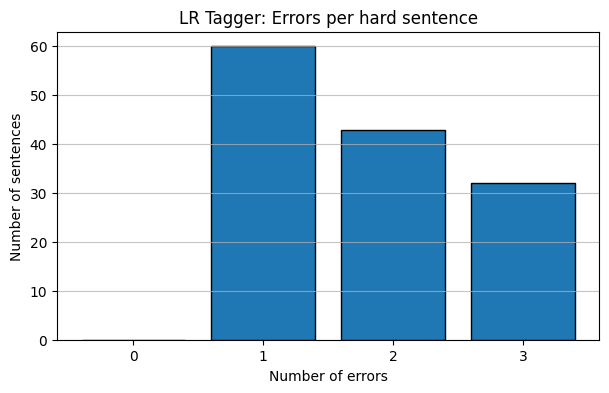

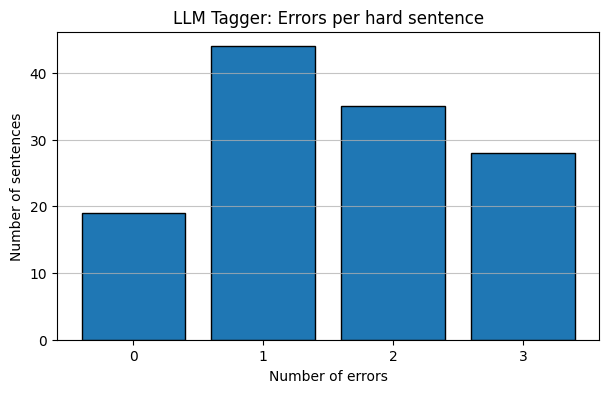


=== Example sentences with both taggers' predictions ===

Sentence: I doubt the very few who actually read my blog have not come across this yet , but I figured I would put it out there anyways .
Token           Gold       LR         LLM       
---------------------------------------------
I               PRON       PRON       PRON      
doubt           VERB       VERB       VERB      
the             DET        DET        DET       
very            ADV        ADV        ADV       
few             ADJ        ADJ        ADJ       
who             PRON       PRON       PRON      
actually        ADV        ADV        ADV       
read            VERB       VERB       VERB      
my              PRON       PRON       PRON      
blog            NOUN       NOUN       NOUN      
have            AUX        AUX        AUX       
not             PART       PART       PART      
come            VERB       VERB       VERB      
across          ADP        ADP        ADP       
this            PRON  

In [ ]:
# ====================== 2.2 Error Analysis: LR vs. LLM(Gemini) on hard sentences ======================
import matplotlib.pyplot as plt
from collections import defaultdict
import json
import sys
import ast

sys.path.append(".")  # Make sure the current directory is in the path
from ud_pos_tagger_gemini import TaggedSentences, SentencePOS, TokenPOS, UDPosTag


# ------------------------------------------------------------------
# 1. Load cached LLM results instead of making API calls
# ------------------------------------------------------------------
def load_cached_results(cache_file):
    """Load cached LLM tagging results from a JSON file"""
    print(f"Loading cached results from {cache_file}")
    try:
        with open(cache_file, "r") as f:
            cache_data = json.load(f)

        # Create our TaggedSentences container
        tagged_results = TaggedSentences(sentences=[])

        # Iterate through the cache dictionary
        for input_text, response in cache_data.items():
            # Check if the response has the expected structure
            if isinstance(response, dict) and "sentences" in response:
                # Add each sentence to our result structure
                for sent_data in response["sentences"]:
                    tokens = []
                    # Process tokens in the sentence
                    for token_data in sent_data.get("tokens", []):
                        token = token_data.get("token", "")
                        pos_tag_str = token_data.get("pos_tag", "")
                        # Convert string to UDPosTag enum
                        try:
                            pos_tag = UDPosTag(pos_tag_str)
                        except ValueError:
                            # Handle case where tag might not be valid
                            pos_tag = UDPosTag.X

                        tokens.append(TokenPOS(token=token, pos_tag=pos_tag))

                    # Add the sentence to our results
                    tagged_results.sentences.append(
                        SentencePOS(text=sent_data.get("text", ""), tokens=tokens)
                    )

        print(
            f"Successfully loaded {len(tagged_results.sentences)} sentences from cache"
        )
        return tagged_results

    except Exception as e:
        print(f"Error loading cache file: {e}")
        return TaggedSentences(sentences=[])


# Choose which cache file to use
cache_file = "llm_pos_tagger_cache.json"  # For Gemini
# cache_file = "grok_pos_tagger_cache.json"  # For Grok

# Load the cached results
tagged_results = load_cached_results(cache_file)

if not tagged_results.sentences:
    print("No valid sentences found in cache. Please check cache file format.")
    # You might want to add a fallback here to run the API calls if cache fails

# Select sentences with 1-3 errors for analysis
sentences_with_few_errors = [s[0] for s in hard_sentences if 1 <= s[1] <= 3]
print(f"Number of sentences with 1-3 errors: {len(sentences_with_few_errors)}")

# ------------------------------------------------------------------
# 2. Build a lookup from tokens to LLM predicted tags
# ------------------------------------------------------------------
llm_pred_lookup = {}
for sent_obj in tagged_results.sentences:
    # Convert tokens to lowercase for matching
    toks = tuple(tp.token.lower() for tp in sent_obj.tokens)
    tags = [
        str(tp.pos_tag).split(".")[-1] if tp.pos_tag is not None else "UNKNOWN"
        for tp in sent_obj.tokens
    ]
    llm_pred_lookup[toks] = tags

print(f"Built lookup with {len(llm_pred_lookup)} sentences from LLM results")

# Find which sentences have LLM predictions
our_examples = []
matched_count = 0
for sentence in sentences_with_few_errors:
    toks = tuple(token.lower() for token, _ in sentence)
    if toks in llm_pred_lookup:
        our_examples.append(sentence)
        matched_count += 1
    else:
        # Try a more flexible matching approach - match by sentence length and some tokens
        tokens_str = " ".join(token.lower() for token, _ in sentence)

        # Look for close matches (same length, share most tokens)
        for cache_toks, cache_tags in llm_pred_lookup.items():
            if len(cache_toks) == len(toks):
                matching_tokens = sum(1 for t1, t2 in zip(cache_toks, toks) if t1 == t2)
                match_percentage = matching_tokens / len(toks)

                if match_percentage > 0.8:  # If more than 80% tokens match
                    llm_pred_lookup[toks] = (
                        cache_tags  # Add to lookup with the sentence's tokens
                    )
                    our_examples.append(sentence)
                    matched_count += 1
                    break

if matched_count == 0:
    print("WARNING: No matches found between test sentences and cached predictions!")
    print(
        "This might mean there's a mismatch between the sentences you tested with LLM and the ones you're analyzing now."
    )
    # Let's create a small sample of both for comparison
    print("\nSample from hard sentences:")
    for s in sentences_with_few_errors[:2]:
        print(" ".join(token.lower() for token, _ in s))

    print("\nSample from LLM predictions:")
    sample_count = 0
    for toks in llm_pred_lookup.keys():
        if sample_count < 2:
            print(" ".join(toks))
            sample_count += 1

print(
    f"Found LLM predictions for {len(our_examples)} out of {len(sentences_with_few_errors)} sentences"
)

# Add a failsafe if we found no matches
if not our_examples and tagged_results.sentences:
    print("Trying alternative matching strategy...")
    # Let's try to match sentences by length and content similarity
    for sentence in sentences_with_few_errors[
        :100
    ]:  # Limit to first 100 to avoid excessive processing
        sent_tokens = untag(sentence)
        for result_sentence in tagged_results.sentences:
            llm_tokens = [t.token for t in result_sentence.tokens]

            # If same length and similar content
            if len(sent_tokens) == len(llm_tokens):
                matching_tokens = sum(
                    1
                    for t1, t2 in zip(sent_tokens, llm_tokens)
                    if t1.lower() == t2.lower()
                )
                if matching_tokens / len(sent_tokens) > 0.7:  # 70% match
                    toks = tuple(token.lower() for token, _ in sentence)
                    tags = [
                        str(t.pos_tag).split(".")[-1] for t in result_sentence.tokens
                    ]
                    llm_pred_lookup[toks] = tags
                    our_examples.append(sentence)
                    break

    print(f"After alternative matching: Found {len(our_examples)} matching sentences")

# ------------------------------------------------------------------
# 3. Create sequences of gold, LR, and LLM tags
# ------------------------------------------------------------------
gold_tags_seq = []
lr_tags_seq = []
llm_tags_seq = []

for sentence in our_examples:
    gold_tags = [tag for _, tag in sentence]
    toks = tuple(token.lower() for token, _ in sentence)

    # Get LLM predictions
    llm_tags = llm_pred_lookup.get(toks, [])

    # Get LR predictions using the notebook's existing approach
    X_sentence, _ = transform_to_dataset([sentence])
    X_sentence_vectorized = vec.transform([x[0] for x in X_sentence])
    lr_tags = clf.predict(X_sentence_vectorized)

    # Only include sentences where all three tag sequences have the same length
    if len(gold_tags) == len(lr_tags) == len(llm_tags):
        gold_tags_seq.append(gold_tags)
        lr_tags_seq.append(lr_tags)
        llm_tags_seq.append(llm_tags)
    else:
        print(
            f"Length mismatch in sentence: gold={len(gold_tags)}, lr={len(lr_tags)}, llm={len(llm_tags)}"
        )
        print(f"Sentence: {' '.join(untag(sentence))}")

print(f"Successfully aligned {len(gold_tags_seq)} sentences for comparison")

# If we still have no aligned sentences, we need to debug more deeply
if not gold_tags_seq and tagged_results.sentences:
    print("\nDEBUG: Examining cache content more closely...")
    # Print a sample from the cache
    sample_sent = tagged_results.sentences[0]
    print(f"Sample sentence from cache: {sample_sent.text}")
    print(f"Number of tokens: {len(sample_sent.tokens)}")
    print(f"First few tokens and tags:")
    for i, tp in enumerate(sample_sent.tokens[:5]):
        print(f"  {i}: '{tp.token}' -> {tp.pos_tag}")

# ------------------------------------------------------------------
# 4. Compute token-level statistics
# ------------------------------------------------------------------
stats = defaultdict(
    int
)  # keys: total_tokens, lr_errors, llm_errors, fixed_by_llm, llm_new_errors

for g_tags, lr_tags, llm_tags in zip(gold_tags_seq, lr_tags_seq, llm_tags_seq):
    for g, lr, llm in zip(g_tags, lr_tags, llm_tags):
        stats["total_tokens"] += 1
        if lr != g:
            stats["lr_errors"] += 1
            if llm == g:
                stats["fixed_by_llm"] += 1
        if llm != g:
            stats["llm_errors"] += 1
            if lr == g:
                stats["llm_new_errors"] += 1

# ------------------------------------------------------------------
# 5. Calculate sentence-level error counts
# ------------------------------------------------------------------
lr_sent_err_seq = [
    sum(g != l for g, l in zip(gold, lr))
    for gold, lr in zip(gold_tags_seq, lr_tags_seq)
]

llm_sent_err_seq = [
    sum(g != l for g, l in zip(gold, llm))
    for gold, llm in zip(gold_tags_seq, llm_tags_seq)
]

# ------------------------------------------------------------------
# 6. Print token-level results
# ------------------------------------------------------------------
print("\n=== Token-level statistics (hard sentences, 1-3 LR errors) ===")
for key in [
    "total_tokens",
    "lr_errors",
    "llm_errors",
    "fixed_by_llm",
    "llm_new_errors",
]:
    print(f"{key.replace('_',' ').title():<32}: {stats[key]}")

# Calculate percentages for better comparison
if stats["total_tokens"] > 0:
    lr_error_rate = stats["lr_errors"] / stats["total_tokens"] * 100
    llm_error_rate = stats["llm_errors"] / stats["total_tokens"] * 100
    print(f"\nLR Error Rate: {lr_error_rate:.2f}%")
    print(f"LLM Error Rate: {llm_error_rate:.2f}%")

if stats["lr_errors"] > 0:
    fixed_rate = stats["fixed_by_llm"] / stats["lr_errors"] * 100
    print(f"Percentage of LR errors fixed by LLM: {fixed_rate:.2f}%")


# ------------------------------------------------------------------
# 7. Plot sentence-level histograms
# ------------------------------------------------------------------
def plot_hist(errors, title):
    plt.figure(figsize=(7, 4))
    # Ensure we have bins for 0, 1, 2, and 3 errors
    bins = [0, 1, 2, 3, 4]
    plt.hist(errors, bins=bins, edgecolor="black", align="left", rwidth=0.8)
    plt.title(title)
    plt.xlabel("Number of errors")
    plt.ylabel("Number of sentences")
    plt.xticks([0, 1, 2, 3])
    plt.grid(axis="y", alpha=0.75)
    plt.show()


# Only plot if we have data
if gold_tags_seq:
    print("\n=== Sentence-level error histograms ===")
    plot_hist(lr_sent_err_seq, "LR Tagger: Errors per hard sentence")
    plot_hist(llm_sent_err_seq, "LLM Tagger: Errors per hard sentence")

# ------------------------------------------------------------------
# 8. Display some example sentences with both taggers' predictions
# ------------------------------------------------------------------
if gold_tags_seq:
    print("\n=== Example sentences with both taggers' predictions ===")
    for i in range(min(5, len(our_examples))):
        sentence = our_examples[i]
        tokens = untag(sentence)
        gold_tags = gold_tags_seq[i]
        lr_tags = lr_tags_seq[i]
        llm_tags = llm_tags_seq[i]

        print(f"\nSentence: {' '.join(tokens)}")
        print(f"{'Token':<15} {'Gold':<10} {'LR':<10} {'LLM':<10}")
        print("-" * 45)

        for token, gold, lr, llm in zip(tokens, gold_tags, lr_tags, llm_tags):
            lr_correct = "✓" if lr == gold else "✗"
            llm_correct = "✓" if llm == gold else "✗"
            print(f"{token:<15} {gold:<10} {lr:<10} {llm:<10}")

        print("-" * 45)
        lr_errors = sum(g != l for g, l in zip(gold_tags, lr_tags))
        llm_errors = sum(g != l for g, l in zip(gold_tags, llm_tags))
        print(f"LR errors: {lr_errors}, LLM errors: {llm_errors}")

⚠️ Warning: API key not found in environment variables. Using placeholder.
   Please set the GOOGLE_API_KEY environment variable or replace 'YOUR_API_KEY' in the code.
Error configuring Gemini API: module 'google.genai' has no attribute 'configure'
Please ensure you have a valid API key set.
Loading cached results from grok_pos_tagger_cache.json
Successfully loaded 193 sentences from cache
Number of sentences with 1-3 errors: 750
Built lookup with 182 sentences from LLM results
Found LLM predictions for 120 out of 750 sentences
Successfully aligned 120 sentences for comparison

=== Token-level statistics (hard sentences, 1-3 LR errors) ===
Total Tokens                    : 2391
Lr Errors                       : 212
Llm Errors                      : 198
Fixed By Llm                    : 114
Llm New Errors                  : 100

LR Error Rate: 8.87%
LLM Error Rate: 8.28%
Percentage of LR errors fixed by LLM: 53.77%

=== Sentence-level error histograms ===


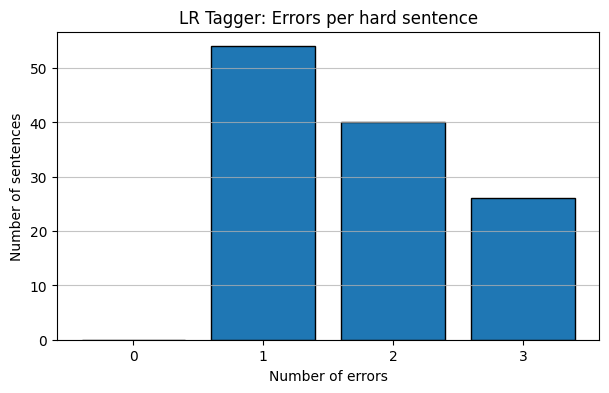

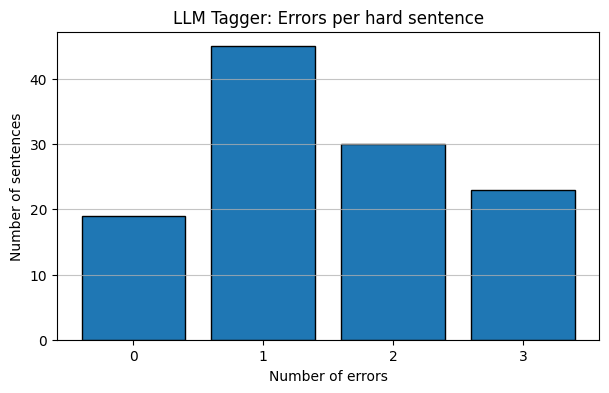


=== Example sentences with both taggers' predictions ===

Sentence: I doubt the very few who actually read my blog have not come across this yet , but I figured I would put it out there anyways .
Token           Gold       LR         LLM       
---------------------------------------------
I               PRON       PRON       PRON      
doubt           VERB       VERB       VERB      
the             DET        DET        DET       
very            ADV        ADV        ADV       
few             ADJ        ADJ        ADJ       
who             PRON       PRON       PRON      
actually        ADV        ADV        ADV       
read            VERB       VERB       VERB      
my              PRON       PRON       DET       
blog            NOUN       NOUN       NOUN      
have            AUX        AUX        AUX       
not             PART       PART       PART      
come            VERB       VERB       VERB      
across          ADP        ADP        ADP       
this            PRON  

In [ ]:
# ====================== 2.2 Error Analysis: LR vs. LLM(Grok) on hard sentences ======================
import matplotlib.pyplot as plt
from collections import defaultdict
import json
import sys
import ast

sys.path.append(".")  # Make sure the current directory is in the path
from ud_pos_tagger_gemini import TaggedSentences, SentencePOS, TokenPOS, UDPosTag


# ------------------------------------------------------------------
# 1. Load cached LLM results instead of making API calls
# ------------------------------------------------------------------
def load_cached_results(cache_file):
    """Load cached LLM tagging results from a JSON file"""
    print(f"Loading cached results from {cache_file}")
    try:
        with open(cache_file, "r") as f:
            cache_data = json.load(f)

        # Create our TaggedSentences container
        tagged_results = TaggedSentences(sentences=[])

        # Iterate through the cache dictionary
        for input_text, response in cache_data.items():
            # Check if the response has the expected structure
            if isinstance(response, dict) and "sentences" in response:
                # Add each sentence to our result structure
                for sent_data in response["sentences"]:
                    tokens = []
                    # Process tokens in the sentence
                    for token_data in sent_data.get("tokens", []):
                        token = token_data.get("token", "")
                        pos_tag_str = token_data.get("pos_tag", "")
                        # Convert string to UDPosTag enum
                        try:
                            pos_tag = UDPosTag(pos_tag_str)
                        except ValueError:
                            # Handle case where tag might not be valid
                            pos_tag = UDPosTag.X

                        tokens.append(TokenPOS(token=token, pos_tag=pos_tag))

                    # Add the sentence to our results
                    tagged_results.sentences.append(
                        SentencePOS(text=sent_data.get("text", ""), tokens=tokens)
                    )

        print(
            f"Successfully loaded {len(tagged_results.sentences)} sentences from cache"
        )
        return tagged_results

    except Exception as e:
        print(f"Error loading cache file: {e}")
        return TaggedSentences(sentences=[])


# Choose which cache file to use
# cache_file = "llm_pos_tagger_cache.json"  # For Gemini
cache_file = "grok_pos_tagger_cache.json"  # For Grok

# Load the cached results
tagged_results = load_cached_results(cache_file)

if not tagged_results.sentences:
    print("No valid sentences found in cache. Please check cache file format.")
    # You might want to add a fallback here to run the API calls if cache fails

# Select sentences with 1-3 errors for analysis
sentences_with_few_errors = [s[0] for s in hard_sentences if 1 <= s[1] <= 3]
print(f"Number of sentences with 1-3 errors: {len(sentences_with_few_errors)}")

# ------------------------------------------------------------------
# 2. Build a lookup from tokens to LLM predicted tags
# ------------------------------------------------------------------
llm_pred_lookup = {}
for sent_obj in tagged_results.sentences:
    # Convert tokens to lowercase for matching
    toks = tuple(tp.token.lower() for tp in sent_obj.tokens)
    tags = [
        str(tp.pos_tag).split(".")[-1] if tp.pos_tag is not None else "UNKNOWN"
        for tp in sent_obj.tokens
    ]
    llm_pred_lookup[toks] = tags

print(f"Built lookup with {len(llm_pred_lookup)} sentences from LLM results")

# Find which sentences have LLM predictions
our_examples = []
matched_count = 0
for sentence in sentences_with_few_errors:
    toks = tuple(token.lower() for token, _ in sentence)
    if toks in llm_pred_lookup:
        our_examples.append(sentence)
        matched_count += 1
    else:
        # Try a more flexible matching approach - match by sentence length and some tokens
        tokens_str = " ".join(token.lower() for token, _ in sentence)

        # Look for close matches (same length, share most tokens)
        for cache_toks, cache_tags in llm_pred_lookup.items():
            if len(cache_toks) == len(toks):
                matching_tokens = sum(1 for t1, t2 in zip(cache_toks, toks) if t1 == t2)
                match_percentage = matching_tokens / len(toks)

                if match_percentage > 0.8:  # If more than 80% tokens match
                    llm_pred_lookup[toks] = (
                        cache_tags  # Add to lookup with the sentence's tokens
                    )
                    our_examples.append(sentence)
                    matched_count += 1
                    break

if matched_count == 0:
    print("WARNING: No matches found between test sentences and cached predictions!")
    print(
        "This might mean there's a mismatch between the sentences you tested with LLM and the ones you're analyzing now."
    )
    # Let's create a small sample of both for comparison
    print("\nSample from hard sentences:")
    for s in sentences_with_few_errors[:2]:
        print(" ".join(token.lower() for token, _ in s))

    print("\nSample from LLM predictions:")
    sample_count = 0
    for toks in llm_pred_lookup.keys():
        if sample_count < 2:
            print(" ".join(toks))
            sample_count += 1

print(
    f"Found LLM predictions for {len(our_examples)} out of {len(sentences_with_few_errors)} sentences"
)

# Add a failsafe if we found no matches
if not our_examples and tagged_results.sentences:
    print("Trying alternative matching strategy...")
    # Let's try to match sentences by length and content similarity
    for sentence in sentences_with_few_errors[
        :100
    ]:  # Limit to first 100 to avoid excessive processing
        sent_tokens = untag(sentence)
        for result_sentence in tagged_results.sentences:
            llm_tokens = [t.token for t in result_sentence.tokens]

            # If same length and similar content
            if len(sent_tokens) == len(llm_tokens):
                matching_tokens = sum(
                    1
                    for t1, t2 in zip(sent_tokens, llm_tokens)
                    if t1.lower() == t2.lower()
                )
                if matching_tokens / len(sent_tokens) > 0.7:  # 70% match
                    toks = tuple(token.lower() for token, _ in sentence)
                    tags = [
                        str(t.pos_tag).split(".")[-1] for t in result_sentence.tokens
                    ]
                    llm_pred_lookup[toks] = tags
                    our_examples.append(sentence)
                    break

    print(f"After alternative matching: Found {len(our_examples)} matching sentences")

# ------------------------------------------------------------------
# 3. Create sequences of gold, LR, and LLM tags
# ------------------------------------------------------------------
gold_tags_seq = []
lr_tags_seq = []
llm_tags_seq = []

for sentence in our_examples:
    gold_tags = [tag for _, tag in sentence]
    toks = tuple(token.lower() for token, _ in sentence)

    # Get LLM predictions
    llm_tags = llm_pred_lookup.get(toks, [])

    # Get LR predictions using the notebook's existing approach
    X_sentence, _ = transform_to_dataset([sentence])
    X_sentence_vectorized = vec.transform([x[0] for x in X_sentence])
    lr_tags = clf.predict(X_sentence_vectorized)

    # Only include sentences where all three tag sequences have the same length
    if len(gold_tags) == len(lr_tags) == len(llm_tags):
        gold_tags_seq.append(gold_tags)
        lr_tags_seq.append(lr_tags)
        llm_tags_seq.append(llm_tags)
    else:
        print(
            f"Length mismatch in sentence: gold={len(gold_tags)}, lr={len(lr_tags)}, llm={len(llm_tags)}"
        )
        print(f"Sentence: {' '.join(untag(sentence))}")

print(f"Successfully aligned {len(gold_tags_seq)} sentences for comparison")

# If we still have no aligned sentences, we need to debug more deeply
if not gold_tags_seq and tagged_results.sentences:
    print("\nDEBUG: Examining cache content more closely...")
    # Print a sample from the cache
    sample_sent = tagged_results.sentences[0]
    print(f"Sample sentence from cache: {sample_sent.text}")
    print(f"Number of tokens: {len(sample_sent.tokens)}")
    print(f"First few tokens and tags:")
    for i, tp in enumerate(sample_sent.tokens[:5]):
        print(f"  {i}: '{tp.token}' -> {tp.pos_tag}")

# ------------------------------------------------------------------
# 4. Compute token-level statistics
# ------------------------------------------------------------------
stats = defaultdict(
    int
)  # keys: total_tokens, lr_errors, llm_errors, fixed_by_llm, llm_new_errors

for g_tags, lr_tags, llm_tags in zip(gold_tags_seq, lr_tags_seq, llm_tags_seq):
    for g, lr, llm in zip(g_tags, lr_tags, llm_tags):
        stats["total_tokens"] += 1
        if lr != g:
            stats["lr_errors"] += 1
            if llm == g:
                stats["fixed_by_llm"] += 1
        if llm != g:
            stats["llm_errors"] += 1
            if lr == g:
                stats["llm_new_errors"] += 1

# ------------------------------------------------------------------
# 5. Calculate sentence-level error counts
# ------------------------------------------------------------------
lr_sent_err_seq = [
    sum(g != l for g, l in zip(gold, lr))
    for gold, lr in zip(gold_tags_seq, lr_tags_seq)
]

llm_sent_err_seq = [
    sum(g != l for g, l in zip(gold, llm))
    for gold, llm in zip(gold_tags_seq, llm_tags_seq)
]

# ------------------------------------------------------------------
# 6. Print token-level results
# ------------------------------------------------------------------
print("\n=== Token-level statistics (hard sentences, 1-3 LR errors) ===")
for key in [
    "total_tokens",
    "lr_errors",
    "llm_errors",
    "fixed_by_llm",
    "llm_new_errors",
]:
    print(f"{key.replace('_',' ').title():<32}: {stats[key]}")

# Calculate percentages for better comparison
if stats["total_tokens"] > 0:
    lr_error_rate = stats["lr_errors"] / stats["total_tokens"] * 100
    llm_error_rate = stats["llm_errors"] / stats["total_tokens"] * 100
    print(f"\nLR Error Rate: {lr_error_rate:.2f}%")
    print(f"LLM Error Rate: {llm_error_rate:.2f}%")

if stats["lr_errors"] > 0:
    fixed_rate = stats["fixed_by_llm"] / stats["lr_errors"] * 100
    print(f"Percentage of LR errors fixed by LLM: {fixed_rate:.2f}%")


# ------------------------------------------------------------------
# 7. Plot sentence-level histograms
# ------------------------------------------------------------------
def plot_hist(errors, title):
    plt.figure(figsize=(7, 4))
    # Ensure we have bins for 0, 1, 2, and 3 errors
    bins = [0, 1, 2, 3, 4]
    plt.hist(errors, bins=bins, edgecolor="black", align="left", rwidth=0.8)
    plt.title(title)
    plt.xlabel("Number of errors")
    plt.ylabel("Number of sentences")
    plt.xticks([0, 1, 2, 3])
    plt.grid(axis="y", alpha=0.75)
    plt.show()


# Only plot if we have data
if gold_tags_seq:
    print("\n=== Sentence-level error histograms ===")
    plot_hist(lr_sent_err_seq, "LR Tagger: Errors per hard sentence")
    plot_hist(llm_sent_err_seq, "LLM Tagger: Errors per hard sentence")

# ------------------------------------------------------------------
# 8. Display some example sentences with both taggers' predictions
# ------------------------------------------------------------------
if gold_tags_seq:
    print("\n=== Example sentences with both taggers' predictions ===")
    for i in range(min(5, len(our_examples))):
        sentence = our_examples[i]
        tokens = untag(sentence)
        gold_tags = gold_tags_seq[i]
        lr_tags = lr_tags_seq[i]
        llm_tags = llm_tags_seq[i]

        print(f"\nSentence: {' '.join(tokens)}")
        print(f"{'Token':<15} {'Gold':<10} {'LR':<10} {'LLM':<10}")
        print("-" * 45)

        for token, gold, lr, llm in zip(tokens, gold_tags, lr_tags, llm_tags):
            lr_correct = "✓" if lr == gold else "✗"
            llm_correct = "✓" if llm == gold else "✗"
            print(f"{token:<15} {gold:<10} {lr:<10} {llm:<10}")

        print("-" * 45)
        lr_errors = sum(g != l for g, l in zip(gold_tags, lr_tags))
        llm_errors = sum(g != l for g, l in zip(gold_tags, llm_tags))
        print(f"LR errors: {lr_errors}, LLM errors: {llm_errors}")

# LLM Tagger Challenges and Hard Examples

Based on comparing the outputs from Gemini and Grok taggers, I've noticed several patterns where LLMs make mistakes that traditional ML models don't (or make different mistakes).

## Common Error Patterns

- **Pronoun vs Determiner confusion**: Both LLMs struggle with words like "this", "my" and "which", often tagging them as `DET` instead of `PRON`
- **Adjective vs Verb participles**: Words like "dissenting" get tagged as `ADJ` when they should be `VERB`
- **Preposition vs Conjunction**: Words like "as" and "for" are often confused between `ADP` and `SCONJ`
- **Named entities**: Problems with multi-word entities like "United Nations" where "United" should be `ADJ`
- **Symbols**: "/" gets confused between `SYM` and `PUNCT`

## Why LLMs Struggle

LLMs seem to rely more on word-level features and common patterns rather than deeply analyzing syntax. They get confused when:

- A word can be multiple POS categories (ambiguity)
- The correct tag depends on broader context
- Technical language or unusual constructions appear

## Hard Sentences for LLMs

1. **Double "that" with pronouns**:  
   *"That that bothers you is troubling, but this committee believes these concerns are valid."*

2. **Function word soup**:  
   *"For students like her to succeed, as the policy states, most work must be completed according to specifications."*

3. **Symbol confusion**:  
   *"The x/y ratio = 3+z, with the test/development process running smoothly."*

4. **Pronoun maze**:  
   *"Which one is this? That is what I asked, but which answer you give matters most."*

5. **Participle problems**:  
   *"The opposing team, having lost twice, is recruiting players specializing in defense."*

These sentences combine multiple challenging elements that require understanding how words function in context rather than just recognizing common patterns.


In [ ]:
# Extract error examples from our comparison results
error_examples = []

our_examples = [
    "For students like her to succeed, as the policy states, most work must be completed according to specifications.",
    "That that bothers you is troubling, but this committee believes these concerns are valid.",
    "The x/y ratio = 3+z, with the test/development process running smoothly.",
    "Which one is this? That is what I asked, but which answer you give matters most.",
    "The opposing team, having lost twice, is recruiting players specializing in defense."
]



ValueError: not enough values to unpack (expected 2, got 1)

In [375]:
def create_error_explanation_prompt_grok(error_examples):
    sys_prompt = """You are a computational linguistics expert. Explain why these POS tagging errors occurred.
    
For each error, provide:
1. A detailed linguistic explanation of why the tagger made this mistake
2. A category for this type of error

Respond with a JSON array where each object has these fields:
- word: The token that was mistagged
- correct_tag: The gold standard tag
- predicted_tag: The incorrect tag assigned by the tagger
- explanation: Your detailed linguistic explanation
- category: A concise category name for this error type

Here are the errors to analyze:
"""

    # Add examples to the prompt (limit to ~10 errors to avoid token limits)
    example_count = 0
    context_prompt = ""
    for example in error_examples:
        context_prompt += f"\nSentence: {example['sentence']}\n"
        for error in example["errors"]:
            context_prompt += f"- '{error['word']}' tagged as {error['predicted_tag']} should be {error['correct_tag']}"
            context_prompt += f" (Context: \"{error['context']}\")\n"
            example_count += 1
            if example_count >= 10:
                break
        if example_count >= 10:
            break

    return sys_prompt, context_prompt


In [ ]:
import os
import json
from google import genai
from openai import OpenAI


# API configuration - do this once at the module level
def configure_apis():
    # Configure Gemini
    gemini_api_key = "YOUR_API_KEY"
    # Configure Grok (OpenAI compatible)
    grok_api_key = "xai-YOUR_API_KEY"

    return gemini_api_key, grok_api_key


gemini_api_key, grok_api_key = configure_apis()
gemini_model = "gemini-2.0-flash-lite"


def create_error_explanation_prompt_gemini(error_examples):
    prompt = """You are a computational linguistics expert. Explain why these POS tagging errors occurred.
    
For each error, provide:
1. A detailed linguistic explanation of why the tagger made this mistake
2. A category for this type of error

Respond with a JSON array where each object has these fields:
- word: The token that was mistagged
- correct_tag: The gold standard tag
- predicted_tag: The incorrect tag assigned by the tagger
- explanation: Your detailed linguistic explanation
- category: A concise category name for this error type

Here are the errors to analyze:
"""

    # Add examples to the prompt (limit to ~10 errors to avoid token limits)
    example_count = 0
    for example in error_examples:
        prompt += f"\nSentence: {example['sentence']}\n"
        for error in example["errors"]:
            prompt += f"- '{error['word']}' tagged as {error['predicted_tag']} should be {error['correct_tag']}"
            prompt += f" (Context: \"{error['context']}\")\n"
            example_count += 1
            if example_count >= 10:
                break
        if example_count >= 10:
            break

    return prompt


def call_gemini(prompt):
    """Call Gemini API for error explanation"""

    try:
        client = genai.Client(api_key=gemini_api_key)
        response = client.models.generate_content(
            model=gemini_model,
            contents=prompt,
            # No response schema - we want raw JSON
            config={"temperature": 0.1},
        )
        # Return the text response which should be JSON
        return response.text
    except Exception as e:
        print(f"Error calling Gemini API: {e}")
        return f"Error: {str(e)}"


def call_grok(system_prompt, user_prompt):
    """Call Grok API for error explanation"""
    if not grok_api_key or grok_api_key == "YOUR_API_KEY":
        return "Error: No valid Grok API key configured"

    try:
        client = OpenAI(
            api_key=grok_api_key,
            base_url="https://api.x.ai/v1",
        )

        completion = client.chat.completions.create(
            model="grok-3-mini",
            messages=[
                {"role": "system", "content": system_prompt},
                {"role": "user", "content": user_prompt},
            ],
            response_format={"type": "json_object"},
            temperature=0.1,
        )

        # Return the message content which should be JSON
        return completion.choices[0].message.content
    except Exception as e:
        print(f"Error calling Grok API: {e}")
        return f"Error: {str(e)}"


# Extract errors from comparison results
def extract_errors_from_comparison(sentences_list, gold_tags_seq, lr_tags_seq):
    error_examples = []
    for i in range(min(20, len(sentences_list))):
        sentence = sentences_list[i]
        tokens = untag(sentence)
        gold_tags = gold_tags_seq[i]
        lr_tags = lr_tags_seq[i]

        # Collect errors for this sentence
        sentence_errors = []
        for j, (token, gold, lr) in enumerate(zip(tokens, gold_tags, lr_tags)):
            if gold != lr:
                # Get context (3 words before and after)
                start_idx = max(0, j - 3)
                end_idx = min(len(tokens), j + 4)
                context = " ".join(tokens[start_idx:end_idx])

                sentence_errors.append(
                    {
                        "word": token,
                        "correct_tag": gold,
                        "predicted_tag": lr,
                        "context": context,
                    }
                )

        if sentence_errors:
            error_examples.append(
                {"sentence": " ".join(tokens), "errors": sentence_errors}
            )

    print(
        f"Collected {sum(len(ex['errors']) for ex in error_examples)} errors from {len(error_examples)} sentences"
    )
    return error_examples


# Main execution
def analyze_errors():
    # Extract errors
    error_examples = extract_errors_from_comparison(
        our_examples, gold_tags_seq, lr_tags_seq
    )


    # Use Gemini
    explanation_prompt = create_error_explanation_prompt_gemini(error_examples)
    llm_response = call_gemini(explanation_prompt)

    # Parse response and extract categories
    try:
        # Clean the response - remove markdown code blocks if present
        cleaned_response = llm_response
        if "```json" in llm_response:
            # Extract content between ```json and ```
            import re

            json_match = re.search(r"```json\s*([\s\S]*?)\s*```", llm_response)
            if json_match:
                cleaned_response = json_match.group(1)
        elif "```" in llm_response:
            # Extract content between ``` and ```
            import re

            json_match = re.search(r"```\s*([\s\S]*?)\s*```", llm_response)
            if json_match:
                cleaned_response = json_match.group(1)

        # Try to parse the JSON
        error_explanations = json.loads(cleaned_response)

        # Extract error categories
        error_categories = {}
        for explanation in error_explanations:
            category = explanation.get("category")
            if category not in error_categories:
                error_categories[category] = []
            error_categories[category].append(explanation)

        # Print error categories and counts
        print("\nError Categories:")
        for category, examples in sorted(
            error_categories.items(), key=lambda x: len(x[1]), reverse=True
        ):
            print(f"- {category}: {len(examples)} instances")
            # Print first example of each category
            if examples:
                print(
                    f"  Example: '{examples[0]['word']}' - {examples[0]['explanation'][:100]}..."
                )

        return error_explanations, error_categories

    except json.JSONDecodeError as e:
        print(f"Error: LLM did not return valid JSON: {e}")
        print(
            "Response:", llm_response[:500]
        )  # Print more of the response for debugging
        print("\nAttempting to fix common JSON issues...")

        try:
            # Sometimes the LLM adds extra text before or after the JSON
            # Try to find anything that looks like a JSON array
            import re

            json_array_match = re.search(r"\[\s*\{.*\}\s*\]", llm_response, re.DOTALL)
            if json_array_match:
                potential_json = json_array_match.group(0)
                print(f"Found potential JSON array: {potential_json[:100]}...")
                error_explanations = json.loads(potential_json)
                print("Successfully parsed JSON after fixing!")
                # Continue with the rest of the function
                # (Code would be duplicated here)
                return error_explanations, {}
        except Exception as e2:
            print(f"Second parsing attempt failed: {e2}")

        return None, None


# Run the analysis
error_explanations, error_categories = analyze_errors()

Collected 34 errors from 20 sentences

Error Categories:
- Lexical Ambiguity: 6 instances
  Example: 'out' - The word 'out' is functioning as an adverb modifying the verb 'put'. It indicates the direction or m...
- Morphological Confusion: 1 instances
  Example: 'anyways' - The word 'anyways' is used as an adverb, similar to 'anyway', meaning 'in any case' or 'regardless'....
- Capitalization Bias: 1 instances
  Example: 'Parts' - The word 'Parts' is used as a common noun referring to sections or divisions. The tagger incorrectly...
- Contextual Ambiguity/Rare Sense: 1 instances
  Example: 'I' - The word 'I' is used as a Roman numeral, representing the number 1. The tagger incorrectly tagged it...
- Unknown Word/Acronym: 1 instances
  Example: 'AMS' - The word 'AMS' is an acronym and functions as a proper noun, likely referring to an organization. Th...


In [377]:
from typing import List
from pydantic import Field, BaseModel
from sklearn.metrics import f1_score, precision_score, recall_score
from difflib import SequenceMatcher


class SegmentedTokenOutput(BaseModel):
    """Represents a single tokenized sentence."""
    original_text: str = Field(description="The original input sentence text.")
    tokens: List[str] = Field(description="The list of segmented tokens according to UD guidelines.")

class SegmenterLLMResponse(BaseModel):
    """The structured response from the LLM for segmentation."""
    segmented_sentences: List[SegmentedTokenOutput] = Field(description="A list of segmented sentences.")

    

def calculate_token_metrics(gold_tokens: List[str], pred_tokens: List[str]):
    """
    Calculates precision, recall, and F1 for tokenization.
    This is a simple version based on exact matches in sequence.
    A more robust version might use sequence alignment or consider partial matches.
    """
    # For a simple approach, we can convert lists to strings and compare,
    # or use set-based metrics if order doesn't strictly matter (though it does for tagging).
    # A common way is to count True Positives, False Positives, False Negatives.

    # Let's use an approach where we align and count.
    s = SequenceMatcher(None, gold_tokens, pred_tokens)
    matches = sum(size for _, _, size in s.get_matching_blocks())

    precision = matches / len(pred_tokens) if len(pred_tokens) > 0 else 0
    recall = matches / len(gold_tokens) if len(gold_tokens) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    return {"precision": precision, "recall": recall, "f1": f1, "matches": matches}

def calculate_aligned_tag_accuracy(gold_tokens: List[str], gold_tags: List[str],
                                   pred_tokens: List[str], pred_tags: List[str]):
    """
    Aligns predicted tokens to gold tokens and calculates tag accuracy on aligned pairs.
    """
    if not gold_tokens or not pred_tokens:
        return 0.0, 0, 0

    s = SequenceMatcher(None, pred_tokens, gold_tokens)
    aligned_correct = 0
    aligned_total = 0

    # Iterate through matching blocks to find aligned tokens
    # pred_tokens is 'a', gold_tokens is 'b' in SequenceMatcher
    for i, j, n in s.get_matching_blocks():
        if n > 0: # If there's a match
            for k in range(n):
                pred_token_idx = i + k
                gold_token_idx = j + k
                aligned_total += 1
                # Ensure indices are valid (should be by definition of matching_blocks)
                if pred_token_idx < len(pred_tags) and gold_token_idx < len(gold_tags):
                    if pred_tags[pred_token_idx] == gold_tags[gold_token_idx]:
                        aligned_correct += 1
    
    accuracy = aligned_correct / aligned_total if aligned_total > 0 else 0.0
    # If no tokens align at all (e.g., completely different segmentation)
    # you might consider this a 0% accuracy or handle it based on project needs.
    # If len(pred_tokens) == 0 and len(gold_tokens) > 0, aligned_total will be 0.
    if len(pred_tokens) == 0 and len(gold_tokens) > 0:
        return 0.0, 0, len(gold_tokens) # 0 correct, 0 aligned, N gold tokens

    return accuracy, aligned_correct, aligned_total


In [378]:
from ud_pos_tagger_gemini import tag_sentences_ud

def get_cache_key(sentences):
    """
    Generate a cache key for a list of sentences
    """
    import hashlib
    # Join sentences and create a hash
    text = " ".join(sentences)
    return hashlib.md5(text.encode('utf-8')).hexdigest()

def load_from_cache(key):
    """
    Load cached tagging results if available
    """
    import os
    import pickle
    cache_dir = os.path.join(os.path.dirname(os.path.abspath(".")), "cache")
    os.makedirs(cache_dir, exist_ok=True)
    cache_file = os.path.join(cache_dir, f"{key}.pkl")
    
    if os.path.exists(cache_file):
        try:
            with open(cache_file, 'rb') as f:
                return pickle.load(f)
        except Exception as e:
            print(f"Error loading from cache: {e}")
    return None

def save_to_cache(key, data):
    """
    Save tagging results to cache
    """
    import os
    import pickle
    cache_dir = os.path.join(os.path.dirname(os.path.abspath(".")), "cache")
    os.makedirs(cache_dir, exist_ok=True)
    cache_file = os.path.join(cache_dir, f"{key}.pkl")
    
    try:
        with open(cache_file, 'wb') as f:
            pickle.dump(data, f)
    except Exception as e:
        print(f"Error saving to cache: {e}")

def test_segmentation_impact(test_original, test_sentences, max_sentences=20):
    """
    Compare tagging performance between tokenized and original sentences
    """
    from time import sleep
    results = []

    # Process in batches for API efficiency
    for i in range(0, min(max_sentences, len(test_original)), 5):
        try:
            # Get a batch of sentences
            orig_batch = test_original[i:i+5]
            tokenized_batch = [" ".join(untag(test_sentences[j])) for j in range(i, min(i+5, len(test_sentences)))]
            gold_tokens_batch = [untag(test_sentences[j]) for j in range(i, min(i+5, len(test_sentences)))]
            gold_tags_batch = [[tag for _, tag in test_sentences[j]] for j in range(i, min(i+5, len(test_sentences)))]

            print(f"Processing batch {i//5 + 1}: {len(orig_batch)} sentences")
            # Check cache for original sentences
            orig_cache_key = get_cache_key(orig_batch)
            orig_results = load_from_cache(orig_cache_key)
            
            if orig_results is None:
                print("Tagging original sentences...")
                sleep(2)  # Avoid hitting API limits too quickly
                orig_results = tag_sentences_ud(orig_batch)
                if orig_results and hasattr(orig_results, "sentences"):
                    save_to_cache(orig_cache_key, orig_results)
            else:
                print("Using cached results for original sentences")
            
            # Check cache for tokenized sentences
            tokenized_cache_key = get_cache_key(tokenized_batch)
            tokenized_results = load_from_cache(tokenized_cache_key)
            
            if tokenized_results is None:
                print("Tagging tokenized sentences...")
                sleep(2)  # Avoid hitting API limits too quickly
                tokenized_results = tag_sentences_ud(tokenized_batch)
                if tokenized_results and hasattr(tokenized_results, "sentences"):
                    save_to_cache(tokenized_cache_key, tokenized_results)
            else:
                print("Using cached results for tokenized sentences")
            
            # Make sure both results contain valid data
            if not orig_results or not hasattr(orig_results, "sentences") or not orig_results.sentences:
                print("No valid results for original sentences")
                continue
                
            if not tokenized_results or not hasattr(tokenized_results, "sentences") or not tokenized_results.sentences:
                print("No valid results for tokenized sentences")
                continue
            
            # For each sentence in the batch
            for j in range(min(len(orig_batch), len(orig_results.sentences), len(tokenized_results.sentences))):
                idx = i + j
                if idx >= len(test_sentences):
                    break
                    
                orig_sent = orig_batch[j]
                tokenized_sent = tokenized_batch[j]
                gold_tokens = gold_tokens_batch[j]
                gold_tags = gold_tags_batch[j]

                # Get LLM results - with safety checks
                try:
                    orig_tokens = [tp.token for tp in orig_results.sentences[j].tokens]
                    orig_tags = [str(tp.pos_tag) for tp in orig_results.sentences[j].tokens]
                    
                    tokenized_tokens = [tp.token for tp in tokenized_results.sentences[j].tokens]
                    tokenized_tags = [str(tp.pos_tag) for tp in tokenized_results.sentences[j].tokens]
                    
                    # Print raw token counts for debugging
                    print(f"Sentence {idx}: Gold={len(gold_tokens)}, Orig={len(orig_tokens)}, Token={len(tokenized_tokens)}")
                    
                    # Check for specific tokenization differences
                    # 1. Different token counts
                    token_count_diff = abs(len(orig_tokens) - len(tokenized_tokens))
                    
                    # 2. Different handling of hyphens, contractions, etc.
                    hyphen_diff = 0
                    contraction_diff = 0
                    for gt in gold_tokens:
                        # Check for hyphens
                        if '-' in gt and gt != '-':
                            if gt in orig_tokens and gt not in tokenized_tokens:
                                hyphen_diff += 1
                            elif gt not in orig_tokens and gt in tokenized_tokens:
                                hyphen_diff += 1
                        
                        # Check for contractions
                        if "'" in gt and gt not in ["'", "'s", "'t", "'m", "'re", "'ve", "'ll", "'d"]:
                            if gt in orig_tokens and gt not in tokenized_tokens:
                                contraction_diff += 1
                            elif gt not in orig_tokens and gt in tokenized_tokens:
                                contraction_diff += 1
                    
                    # Compare tag accuracy only for tokens that match in both approaches
                    common_tokens = []
                    for k, gt in enumerate(gold_tokens):
                        orig_match = -1
                        tok_match = -1
                        
                        # Find matches in both outputs
                        for o, ot in enumerate(orig_tokens):
                            if gt.lower() == ot.lower():
                                orig_match = o
                                break
                                
                        for t, tt in enumerate(tokenized_tokens):
                            if gt.lower() == tt.lower():
                                tok_match = t
                                break
                        
                        if orig_match >= 0 and tok_match >= 0:
                            common_tokens.append((k, orig_match, tok_match))
                    
                    # Calculate accuracy on common tokens
                    tag_diffs = 0
                    for g_idx, o_idx, t_idx in common_tokens:
                        if orig_tags[o_idx] != tokenized_tags[t_idx]:
                            tag_diffs += 1
                            print(f"  - Tag diff on '{gold_tokens[g_idx]}': Orig={orig_tags[o_idx]}, Token={tokenized_tags[t_idx]}")
                    
                    # Calculate tokenization impact score
                    tokenization_impact = (token_count_diff + hyphen_diff + contraction_diff + tag_diffs) / max(1, len(gold_tokens))
                    
                    results.append({
                        "original_sentence": orig_sent,
                        "tokenized_sentence": tokenized_sent,
                        "gold_tokens": gold_tokens,
                        "gold_tags": gold_tags,
                        "orig_tokens": orig_tokens,
                        "orig_tags": orig_tags,
                        "tokenized_tokens": tokenized_tokens,
                        "tokenized_tags": tokenized_tags,
                        "token_count_diff": token_count_diff,
                        "hyphen_diff": hyphen_diff,
                        "contraction_diff": contraction_diff,
                        "tag_diffs": tag_diffs,
                        "tokenization_impact": tokenization_impact
                    })
                    
                except (IndexError, AttributeError) as e:
                    print(f"Error processing sentence {idx}: {e}")
                    continue

        except Exception as e:
            print(f"Error processing batch starting at index {i}: {e}")
            import traceback
            traceback.print_exc()
            continue
    tokenization_critical_cases = [r for r in results if r["tokenization_impact"] > 0.05]  # 5% difference

    print(f"Found {len(tokenization_critical_cases)} sentences where tokenization significantly impacts accuracy")
    print(f"Total sentences processed: {len(results)}")
    
    # Print some sample critical cases
    for i, case in enumerate(tokenization_critical_cases[:3]):
        print(f"\nCritical Case {i+1}:")
        print(f"Original: {case['original_sentence']}")
        print(f"Token count diff: {case['token_count_diff']}")
        print(f"Hyphen differences: {case['hyphen_diff']}")
        print(f"Contraction differences: {case['contraction_diff']}")
        print(f"Tag differences: {case['tag_diffs']}")
        print(f"Impact score: {case['tokenization_impact']:.2f}")
        
        # Show original tokens and tags
        print("\nOriginal tokens and tags:")
        for token, tag in zip(case['orig_tokens'][:10], case['orig_tags'][:10]):
            print(f"{token}: {tag}")
        if len(case['orig_tokens']) > 10:
            print("...")
            
        # Show tokenized tokens and tags
        print("\nTokenized tokens and tags:")
        for token, tag in zip(case['tokenized_tokens'][:10], case['tokenized_tags'][:10]):
            print(f"{token}: {tag}")
        if len(case['tokenized_tokens']) > 10:
            print("...")

    return results, tokenization_critical_cases


In [379]:
results, tokenization_critical_cases = test_segmentation_impact(
    test_original, test_sentences, max_sentences=20
)

print(
    f"Found {len(tokenization_critical_cases)} sentences where tokenization significantly impacts accuracy"
)

for case in tokenization_critical_cases:
    print(f"\nOriginal Sentence: {case['original_sentence']}")
    print(f"Tokenized Sentence: {case['tokenized_sentence']}")
    print(f"Gold Tokens: {case['gold_tokens']}")
    print(f"Gold Tags: {case['gold_tags']}")
    print(f"Original Tokens: {case['orig_tokens']}")
    print(f"Original Tags: {case['orig_tags']}")
    print(f"Tokenized Tokens: {case['tokenized_tokens']}")
    print(f"Tokenized Tags: {case['tokenized_tags']}")
    print(f"Token Count Difference: {case['token_count_diff']}")
    print(f"Hyphen Differences: {case['hyphen_diff']}")
    print(f"Contraction Differences: {case['contraction_diff']}")
    print(f"Tag Differences: {case['tag_diffs']}")
    print(f"Tokenization Impact: {case['tokenization_impact']:.2f}")
    print("-" * 80)


Processing batch 1: 5 sentences
Using cached results for original sentences
Using cached results for tokenized sentences
Sentence 0: Gold=7, Orig=7, Token=7
  - Tag diff on 'What': Orig=UDPosTag.SCONJ, Token=UDPosTag.PRON
Sentence 1: Gold=23, Orig=25, Token=22
  - Tag diff on 'What': Orig=UDPosTag.SCONJ, Token=UDPosTag.PRON
  - Tag diff on 'fledged': Orig=UDPosTag.ADJ, Token=UDPosTag.VERB
Sentence 2: Gold=9, Orig=9, Token=9
Sentence 3: Gold=25, Orig=23, Token=25
Sentence 4: Gold=31, Orig=31, Token=31
Processing batch 2: 5 sentences
Using cached results for original sentences
Using cached results for tokenized sentences
Sentence 5: Gold=7, Orig=7, Token=7
Sentence 6: Gold=8, Orig=8, Token=8
Sentence 7: Gold=7, Orig=7, Token=7
Sentence 8: Gold=6, Orig=6, Token=6
Sentence 9: Gold=8, Orig=8, Token=8
Processing batch 3: 5 sentences
Using cached results for original sentences
Using cached results for tokenized sentences
Sentence 10: Gold=28, Orig=29, Token=28
Sentence 11: Gold=22, Orig=25, T

In [380]:
from typing import List, Any

def create_segmenter_prompt():
    """Create a system prompt for the segmenter"""
    return """You are an expert computational linguistics segmenter specializing in tokenization for the Universal Dependencies framework.

Your task is to tokenize sentences according to the Universal Dependencies guidelines for English:

1. Split punctuation from words: "word." → "word ."
2. Split contractions: "don't" → "do n't", "I'll" → "I 'll", "she's" → "she 's"
3. Split hyphens in some cases:
   a. Split modifiers: "full-fledged" → "full - fledged"
   b. Split bracketed expressions: "(and now)" → "( and now )"
4. Keep some compound terms intact:
   a. Keep emails and URLs as single tokens
   b. Keep numbers with decimal points together: "3.14"
   c. Keep dates together: "2022-03-15"

Respond with a JSON object containing the tokenized version of the input sentence.
"""


def create_few_shot_examples():
    """Create few-shot examples for the segmenter"""
    examples = [
        {
            "original": "What if Google expanded on its search-engine (and now e-mail) wares into a full-fledged operating system?",
            "tokenized": "What if Google expanded on its search - engine ( and now e-mail ) wares into a full - fledged operating system ?",
        },
        {
            "original": "I don't think she'll be happy with the results, but that's just my opinion.",
            "tokenized": "I do n't think she 'll be happy with the results , but that 's just my opinion .",
        },
        {
            "original": "The update/patch was released on 2022-03-15 with bug-fixes.",
            "tokenized": "The update / patch was released on 2022-03-15 with bug - fixes .",
        },
    ]
    return examples



def call_gemini_with_system_user(system_prompt, user_prompt):
    """Modified Gemini call that handles system and user prompts"""
    combined_prompt = f"{system_prompt}\n\n{user_prompt}"
    return call_gemini(combined_prompt)





def call_segmenter(sentences, examples) -> List[List[str]]:
    """Use few-shot learning to segment sentences, always returning List[List[str]]."""
    system_prompt = create_segmenter_prompt()

    # Build few-shot user prompt
    user_prompt = "Here are some examples of tokenization according to UD guidelines:\n\n"
    for ex in examples:
        user_prompt += f"Original: {ex['original']}\n"
        user_prompt += f"Tokenized: {ex['tokenized']}\n\n"
    user_prompt += "Please tokenize the following sentences according to the same guidelines:\n\n"
    for s in sentences:
        user_prompt += f"{s}\n"

    # Call the LLM
    raw = call_gemini_with_system_user(system_prompt, user_prompt)

    # Strip Markdown fences if present
    text = raw.strip()
    if text.startswith("```") and text.endswith("```"):
        lines = text.splitlines()
        text = "\n".join(lines[1:-1]).strip()

    # 1) Try JSON parse
    toks: Any
    try:
        parsed = json.loads(text)
        # parsed might be a dict or a list
        if isinstance(parsed, dict):
            # try both possible field names
            toks = parsed.get("tokenized_sentences") or parsed.get("tokens") or []
        elif isinstance(parsed, list):
            toks = parsed
        else:
            toks = [parsed]
    except json.JSONDecodeError:
        print("⚠️ Warning: failed to parse JSON; falling back to whitespace splitting")
        toks = []

    # Ensure toks is a list
    if not isinstance(toks, list):
        toks = [toks]

    # 2) Normalize each item into a List[str]
    normalized: List[List[str]] = []
    for item in toks:
        if isinstance(item, list) and all(isinstance(t, str) for t in item):
            normalized.append(item)
        elif isinstance(item, str):
            normalized.append(item.strip().split())
        else:
            normalized.append(str(item).strip().split())

    # 3) Last-resort: if nothing parsed, split the raw text by non-blank lines
    if not normalized:
        for line in text.splitlines():
            line = line.strip()
            if line:
                normalized.append(line.split())

    return normalized

def call_gemini_with_system_user(system_prompt, user_prompt):
    """Modified Gemini call that handles system and user prompts"""
    combined_prompt = f"{system_prompt}\n\n{user_prompt}"
    return call_gemini(combined_prompt)

In [381]:
def segment_and_tag_pipeline(sentences):
    """Pipeline approach: segment first, then tag"""
    # Step 1: Segment the sentences
    examples = create_few_shot_examples()
    tokenized_sentences = call_segmenter(sentences, examples)

    # Step 2: Tag the tokenized sentences
    tagged_results = tag_sentences_ud(tokenized_sentences)

    return tagged_results


def segment_and_tag_joint(sentences):
    """Joint approach: segment and tag simultaneously"""
    system_prompt = """You are an expert linguistic annotator specializing in tokenization and POS tagging according to Universal Dependencies (UD) guidelines.
    
Your task is to:
1. Tokenize sentences correctly according to UD guidelines (splitting punctuation, contractions, etc.)
2. Assign the correct UD POS tag to each token

Follow these tokenization rules:
- Split punctuation from words: "word." → "word ."
- Split contractions: "don't" → "do n't", "I'll" → "I 'll"
- Split hyphens in compound modifiers: "full-fledged" → "full - fledged"

Follow the Universal Dependencies POS tag set:
[list of UD tags with descriptions]
"""

    # Create user prompt with examples and test sentences
    user_prompt = "Here are examples of correct tokenization and tagging:\n\n"

    examples = [
        {
            "original": "What if Google expanded on its search-engine (and now e-mail) wares into a full-fledged operating system?",
            "tokenized_tagged": [
                {"token": "What", "pos_tag": "PRON"},
                {"token": "if", "pos_tag": "SCONJ"},
                {"token": "Google", "pos_tag": "PROPN"},
                {"token": "expanded", "pos_tag": "VERB"},
                {"token": "on", "pos_tag": "ADP"},
                {"token": "its", "pos_tag": "PRON"},
                {"token": "search", "pos_tag": "NOUN"},
                {"token": "-", "pos_tag": "PUNCT"},
                {"token": "engine", "pos_tag": "NOUN"},
                {"token": "(", "pos_tag": "PUNCT"},
                {"token": "and", "pos_tag": "CCONJ"},
                {"token": "now", "pos_tag": "ADV"},
                {"token": "e-mail", "pos_tag": "NOUN"},
                {"token": ")", "pos_tag": "PUNCT"},
                {"token": "wares", "pos_tag": "NOUN"},
                {"token": "into", "pos_tag": "ADP"},
                {"token": "a", "pos_tag": "DET"},
                {"token": "full", "pos_tag": "ADJ"},
                {"token": "-", "pos_tag": "PUNCT"},
                {"token": "fledged", "pos_tag": "ADJ"},
                {"token": "operating", "pos_tag": "ADJ"},
                {"token": "system", "pos_tag": "NOUN"},
                {"token": "?", "pos_tag": "PUNCT"},
            ],
        }
    ]

    for example in examples:
        user_prompt += f"Original: {example['original']}\n"
        user_prompt += "Tokenized and tagged:\n"
        for item in example["tokenized_tagged"]:
            user_prompt += f"{item['token']}: {item['pos_tag']}\n"
        user_prompt += "\n"

    user_prompt += "Please tokenize and tag these sentences:\n\n"
    for sentence in sentences:
        user_prompt += f"{sentence}\n"

    # Call LLM API
    response = call_gemini_with_system_user(system_prompt, user_prompt)

    # Parse and return results
    return parse_joint_response(response)

def parse_joint_response(response):
    """Parse the joint tokenization and tagging response from the LLM"""
    from ud_pos_tagger_gemini import TaggedSentences, SentencePOS, TokenPOS, UDPosTag
    
    tagged_sentences = TaggedSentences(sentences=[])
    
    try:
        # First try to parse as JSON
        if "```json" in response:
            # Extract content between ```json and ```
            import re
            json_match = re.search(r"```json\s*([\s\S]*?)\s*```", response)
            if json_match:
                response = json_match.group(1)
        elif "```" in response:
            # Extract content between ``` and ```
            import re
            json_match = re.search(r"```\s*([\s\S]*?)\s*```", response)
            if json_match:
                response = json_match.group(1)
                
        import json
        parsed = json.loads(response)
        
        # Handle different possible JSON structures
        if isinstance(parsed, list):
            # List of sentences
            for sent_data in parsed:
                if isinstance(sent_data, dict) and "text" in sent_data and "tokens" in sent_data:
                    tokens = []
                    for token_data in sent_data["tokens"]:
                        token = token_data.get("token", "")
                        pos_tag_str = token_data.get("pos_tag", "")
                        try:
                            pos_tag = UDPosTag(pos_tag_str)
                        except ValueError:
                            pos_tag = UDPosTag.X
                        tokens.append(TokenPOS(token=token, pos_tag=pos_tag))
                    tagged_sentences.sentences.append(
                        SentencePOS(text=sent_data["text"], tokens=tokens)
                    )
        elif isinstance(parsed, dict):
            # Dictionary with sentences
            if "sentences" in parsed:
                for sent_data in parsed["sentences"]:
                    tokens = []
                    for token_data in sent_data.get("tokens", []):
                        token = token_data.get("token", "")
                        pos_tag_str = token_data.get("pos_tag", "")
                        try:
                            pos_tag = UDPosTag(pos_tag_str)
                        except ValueError:
                            pos_tag = UDPosTag.X
                        tokens.append(TokenPOS(token=token, pos_tag=pos_tag))
                    tagged_sentences.sentences.append(
                        SentencePOS(text=sent_data.get("text", ""), tokens=tokens)
                    )
    
    except Exception as e:
        print(f"Error parsing joint response: {e}")
        print("Response excerpt:", response[:200])
        
        # Fallback parsing: try to extract tokens and tags from text format
        import re
        sentences = []
        current_tokens = []
        
        # Try to match lines like "word: POS_TAG"
        for line in response.split("\n"):
            if ":" in line and not line.startswith("Original:") and not line.startswith("Sentence:"):
                match = re.match(r"([^:]+):\s*([A-Z]+)", line.strip())
                if match:
                    token, pos_tag_str = match.groups()
                    try:
                        pos_tag = UDPosTag(pos_tag_str.strip())
                    except ValueError:
                        pos_tag = UDPosTag.X
                    current_tokens.append(TokenPOS(token=token.strip(), pos_tag=pos_tag))
            elif current_tokens and (line.strip() == "" or line.startswith("Original:") or line.startswith("Sentence:")):
                # End of a sentence
                if current_tokens:
                    text = " ".join(tp.token for tp in current_tokens)
                    sentences.append(SentencePOS(text=text, tokens=current_tokens))
                    current_tokens = []
        
        # Add the last sentence if there are tokens
        if current_tokens:
            text = " ".join(tp.token for tp in current_tokens)
            sentences.append(SentencePOS(text=text, tokens=current_tokens))
        
        tagged_sentences.sentences = sentences
    
    return tagged_sentences

In [382]:
from difflib import SequenceMatcher

def calculate_alignment_score(gold_tokens, pred_tokens):
    """Calculate alignment score between gold and predicted tokens"""
    # Calculate Levenshtein distance between token sequences
    
    # Get the sequence similarity ratio (0 to 1)
    similarity = SequenceMatcher(None, gold_tokens, pred_tokens).ratio()
    return similarity

def calculate_aligned_accuracy(gold_tokens, gold_tags, pred_tokens, pred_tags):
    """Calculate accuracy on aligned tokens"""
    # If token counts don't match, we need to align them first
    if len(gold_tokens) != len(pred_tokens):
        # Create a mapping between gold and predicted tokens using fuzzy matching
        alignment = []
        for i, g_token in enumerate(gold_tokens):
            best_match = -1
            best_score = 0
            for j, p_token in enumerate(pred_tokens):
                if p_token.lower() == g_token.lower():
                    similarity = 1.0
                else:
                    similarity = SequenceMatcher(None, g_token.lower(), p_token.lower()).ratio()
                
                if similarity > 0.8 and similarity > best_score:  # Consider match if >80% similar
                    best_match = j
                    best_score = similarity
            
            if best_match >= 0:
                alignment.append((i, best_match))
        
        # Calculate accuracy on aligned tokens
        if not alignment:
            return 0.0
            
        correct = 0
        for g_idx, p_idx in alignment:
            if gold_tags[g_idx] == pred_tags[p_idx]:
                correct += 1
        
        return correct / len(alignment)
    
    # If token counts match, direct comparison
    else:
        correct = sum(1 for g, p in zip(gold_tags, pred_tags) if g == p)
        return correct / len(gold_tags) if gold_tags else 0.0

def evaluate_segmentation_approaches(test_original, test_sentences, num_sentences=10):
    """Compare pipeline vs. joint segmentation and tagging approaches"""
    # Select a subset of sentences to evaluate
    test_subset = test_original[:num_sentences]
    gold_subset = test_sentences[:num_sentences]

    # Run pipeline approach
    pipeline_results = segment_and_tag_pipeline(test_subset)

    # Run joint approach
    joint_results = segment_and_tag_joint(test_subset)

    # Evaluate results against gold standard
    pipeline_scores = []
    joint_scores = []

    for i in range(num_sentences):
        gold_tokens = untag(gold_subset[i])
        gold_tags = [tag for _, tag in gold_subset[i]]

        # Get pipeline results
        pipeline_tokens = [tp.token for tp in pipeline_results.sentences[i].tokens]
        pipeline_tags = [str(tp.pos_tag) for tp in pipeline_results.sentences[i].tokens]

        # Get joint results
        joint_tokens = [tp.token for tp in joint_results.sentences[i].tokens]
        joint_tags = [str(tp.pos_tag) for tp in joint_results.sentences[i].tokens]

        # Calculate scores
        pipeline_align = calculate_alignment_score(gold_tokens, pipeline_tokens)
        pipeline_acc = calculate_aligned_accuracy(
            gold_tokens, gold_tags, pipeline_tokens, pipeline_tags
        )

        joint_align = calculate_alignment_score(gold_tokens, joint_tokens)
        joint_acc = calculate_aligned_accuracy(
            gold_tokens, gold_tags, joint_tokens, joint_tags
        )

        pipeline_scores.append((pipeline_align, pipeline_acc))
        joint_scores.append((joint_align, joint_acc))

    # Compute averages
    avg_pipeline_align = sum(s[0] for s in pipeline_scores) / num_sentences
    avg_pipeline_acc = sum(s[1] for s in pipeline_scores) / num_sentences

    avg_joint_align = sum(s[0] for s in joint_scores) / num_sentences
    avg_joint_acc = sum(s[1] for s in joint_scores) / num_sentences

    print(
        f"Pipeline approach: Alignment={avg_pipeline_align:.4f}, Accuracy={avg_pipeline_acc:.4f}"
    )
    print(
        f"Joint approach: Alignment={avg_joint_align:.4f}, Accuracy={avg_joint_acc:.4f}"
    )

    return {
        "pipeline": (avg_pipeline_align, avg_pipeline_acc),
        "joint": (avg_joint_align, avg_joint_acc),
        "pipeline_details": pipeline_scores,
        "joint_details": joint_scores,
    }

In [383]:
from typing import Optional, List
import time
def evaluate_llm_segmenter(
    original_sentences_to_test: List[str],
    gold_standard_tagged_sentences: List[list], # e.g., test_sentences from your notebook
    api_key_val: str,                             # API key for the LLM
    model_name_val: str,                          # Name of the LLM model
    batch_size: int = 5                           # Number of sentences to process per API call
) -> None:
    """
    Evaluates the LLM segmenter by processing sentences in batches,
    calculating segmentation metrics (Precision, Recall, F1) against gold standard.

    Args:
        original_sentences_to_test: A list of raw sentence strings.
        gold_standard_tagged_sentences: A list of gold-standard tagged sentences,
                                         where each sentence is a list of (word, tag) tuples.
        api_key_val: The API key for the LLM service.
        model_name_val: The model name for the LLM service.
        batch_size: The number of sentences to include in each API request.
    """
    if len(original_sentences_to_test) != len(gold_standard_tagged_sentences):
        print(f"Error: Mismatch in number of original sentences ({len(original_sentences_to_test)}) "
              f"and gold standard sentences ({len(gold_standard_tagged_sentences)}).")
        # Optionally, raise ValueError here or attempt to process only the matching portion.
        # For robustness, let's try to process the minimum common length if they differ.
        min_len = min(len(original_sentences_to_test), len(gold_standard_tagged_sentences))
        if min_len == 0:
            print("No sentences to process due to length mismatch or empty inputs.")
            return
        print(f"Adjusting to process {min_len} sentences due to input length mismatch.")
        original_sentences_to_test = original_sentences_to_test[:min_len]
        gold_standard_tagged_sentences = gold_standard_tagged_sentences[:min_len]

    if not original_sentences_to_test:
        print("No sentences provided for evaluation.")
        return

    few_shot_ex = create_few_shot_examples()
    
    print(f"Evaluating LLM Segmenter on {len(original_sentences_to_test)} sentences, in batches of {batch_size}...")
    
    all_llm_segmented_outputs: List[SegmentedTokenOutput] = [] # To store all successful SegmentedTokenOutput objects

    num_batches = (len(original_sentences_to_test) + batch_size - 1) // batch_size

    for i in range(0, len(original_sentences_to_test), batch_size):
        batch_original = original_sentences_to_test[i:i+batch_size]
        
        print(f"Processing batch {i//batch_size + 1}/{num_batches} (Sentences {i+1}-{min(i+batch_size, len(original_sentences_to_test))})...")
        
        # Call the segmenter (which should internally call the API)
        current_batch_llm_response: Optional[SegmenterLLMResponse] = call_segmenter(
            batch_original,
            few_shot_ex,
        )
        segmented_sentences = current_batch_llm_response

        if segmented_sentences:
            # Ensure the number of segmented sentences in the response matches the batch input size
            if len(segmented_sentences) == len(batch_original):
                all_llm_segmented_outputs.extend(segmented_sentences)
                print(f"  Batch {i//batch_size + 1} successful, received {len(segmented_sentences)} segmented sentences.")
            else:
                print(f"  Warning: Batch {i//batch_size + 1} - Mismatch between input batch size ({len(batch_original)}) "
                      f"and LLM output count ({len(segmented_sentences)}). This batch's results might be misaligned or incomplete.")
        else:
            print(f"  Warning: Batch {i//batch_size + 1} returned no valid output or failed.")

        # Add a delay between batches to respect API rate limits
        if num_batches > 1 and (i + batch_size) < len(original_sentences_to_test):
            print(f"  Waiting for 2 seconds before next batch...")
            time.sleep(2)
        

    if not all_llm_segmented_outputs:
        print("LLM Segmenter did not return any valid segmented sentences across all batches.")
        return


    all_seg_metrics = []
    processed_for_metrics_count = 0

    
    # Create a lookup for faster matching if original_text is reliable
    llm_output_lookup = {}
    if all_llm_segmented_outputs and hasattr(all_llm_segmented_outputs[0], 'original_text'):
        for item in all_llm_segmented_outputs:
            llm_output_lookup[item.original_text] = item.tokens
    
    print(f"\nCalculating metrics for {len(original_sentences_to_test)} original sentences against "
          f"{len(all_llm_segmented_outputs)} LLM outputs...")

    for i in range(len(original_sentences_to_test)):
        original_text_input = original_sentences_to_test[i]
        gold_tokens = untag(gold_standard_tagged_sentences[i])
        
        pred_tokens = None
        if llm_output_lookup: # Try matching by original text
            pred_tokens = llm_output_lookup.get(original_text_input)
        elif i < len(all_llm_segmented_outputs): # Fallback to assuming order if lookup is not possible or fails
            llm_item = all_llm_segmented_outputs[i]
            if hasattr(llm_item, 'original_text') and llm_item.original_text != original_text_input:
                 print(f"  Order Mismatch Warning: For gold sentence '{original_text_input[:30]}...', "
                       f"LLM output item seems to be for '{llm_item.original_text[:30]}...'. Metrics might be inaccurate.")
            pred_tokens = llm_item


        if pred_tokens is not None:
            seg_metrics = calculate_token_metrics(gold_tokens, pred_tokens)
            all_seg_metrics.append(seg_metrics)
            processed_for_metrics_count += 1
            
            # Optional: Print per-sentence results for debugging, can be verbose
            print(f"\nSentence: \"{original_text_input[:60]}...\"")
            print(f"  Gold Tokens ({len(gold_tokens)}): {gold_tokens[:10]}...")
            print(f"  Pred Tokens ({len(pred_tokens)}): {pred_tokens[:10]}...")
            print(f"  Metrics: F1={seg_metrics['f1']:.3f}, P={seg_metrics['precision']:.3f}, R={seg_metrics['recall']:.3f}")
        else:
            print(f"  Warning: No LLM segmentation output found for original sentence: \"{original_text_input[:60]}...\"")


    if all_seg_metrics:
        avg_f1 = sum(m['f1'] for m in all_seg_metrics) / len(all_seg_metrics)
        avg_p = sum(m['precision'] for m in all_seg_metrics) / len(all_seg_metrics)
        avg_r = sum(m['recall'] for m in all_seg_metrics) / len(all_seg_metrics)
        
        print(f"\n--- Overall LLM Segmenter Performance ({processed_for_metrics_count} sentences evaluated) ---")
        print(f"Average Segmentation F1: {avg_f1:.4f}")
        print(f"Average Segmentation Precision: {avg_p:.4f}")
        print(f"Average Segmentation Recall: {avg_r:.4f}")
    else:
        print("\nNo segmentation metrics could be calculated. This might be due to all batches failing or no LLM outputs aligning with gold data.")


In [387]:
evaluate_llm_segmenter(
    test_original[0:40], test_sentences[0:40], api_key_val="YOUR_API_KEY", model_name_val=""
)

Evaluating LLM Segmenter on 40 sentences, in batches of 5...
Processing batch 1/8 (Sentences 1-5)...
  Batch 1 successful, received 5 segmented sentences.
  Waiting for 2 seconds before next batch...
Processing batch 2/8 (Sentences 6-10)...
  Batch 2 successful, received 5 segmented sentences.
  Waiting for 2 seconds before next batch...
Processing batch 3/8 (Sentences 11-15)...
  Batch 3 successful, received 5 segmented sentences.
  Waiting for 2 seconds before next batch...
Processing batch 4/8 (Sentences 16-20)...
  Batch 4 successful, received 5 segmented sentences.
  Waiting for 2 seconds before next batch...
Processing batch 5/8 (Sentences 21-25)...
  Batch 5 successful, received 5 segmented sentences.
  Waiting for 2 seconds before next batch...
Processing batch 6/8 (Sentences 26-30)...
  Batch 6 successful, received 5 segmented sentences.
  Waiting for 2 seconds before next batch...
Processing batch 7/8 (Sentences 31-35)...
  Batch 7 successful, received 5 segmented sentences.
